In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
from igor2 import binarywave as bw
import glob
import pickle
from pathlib import Path
from matplotlib.transforms import Bbox
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.colors import TwoSlopeNorm
from scipy.interpolate import griddata
from scipy.ndimage import gaussian_filter1d
import re
from scipy.interpolate import RBFInterpolator

In [ ]:
from scipy.fftpack import fft2, ifft2, fftshift
from scipy.stats import binned_statistic
from scipy.stats import binned_statistic
from scipy.ndimage import gaussian_filter, maximum_filter, minimum_filter
import matplotlib.patches as patches

from scipy.spatial import Voronoi
from skimage.filters import gaussian
from skimage.feature import peak_local_max
from skimage.morphology import disk
from shapely.geometry import Polygon

In [ ]:
!pip install igor2

In [ ]:

import warnings
warnings.filterwarnings('ignore')

# Data preparation

In [ ]:

def flatten_image(image, order=1, axis=1):

    flattened_image = np.copy(image)

    num_lines = image.shape[axis]
    length = image.shape[1 - axis]
    x = np.arange(length)

    for i in range(num_lines):
        line = image[i, :] if axis == 0 else image[:, i]
        coeffs = np.polyfit(x, line, deg=order)
        fit_line = np.polyval(coeffs, x)

        if axis == 0:
            flattened_image[i, :] = line - fit_line
        else:
            flattened_image[:, i] = line - fit_line

    return flattened_image

def normalizer(img):
    img = np.asarray(img, dtype=float)
    return (img - np.min(img)) / (np.max(img) - np.min(img) + 1e-12)

# Define once
red_white_blue = LinearSegmentedColormap.from_list(
    "red_white_blue",
    ["blue", "white", "red"]
)

# Grid analysis

In [ ]:

with open("auconi_mfm_grid.pkl", "rb") as f:
    data = pickle.load(f)


print(data.keys())

dict_keys(['positions', 'images'])


In [ ]:
images = data["images"]
positions = data["positions"]

images = np.array(images[:23])
positions = np.array(positions[:23])  # overwrite the same variable

print(images.shape)
print(positions.shape)

(23, 5, 256, 256)
(23, 2)


vmin=-0.00, vcenter=0.00, vmax=0.00


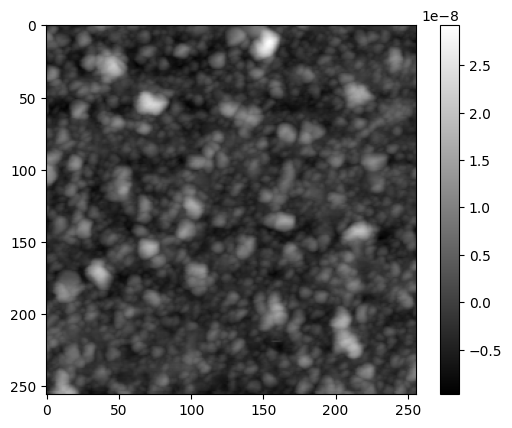

In [ ]:
slice_img = images[22][0]

vmin = np.min(slice_img)
vmax = np.max(slice_img)
vcenter = (vmin + vmax) / 2

# Create adaptive normalization
norm = TwoSlopeNorm(vmin=vmin, vcenter=vcenter, vmax=vmax)

print(f"vmin={vmin:.2f}, vcenter={vcenter:.2f}, vmax={vmax:.2f}")

#plt.imshow(slice_img, cmap=red_white_blue, norm=norm)
plt.imshow(slice_img, cmap="gray")
plt.colorbar()
plt.show()

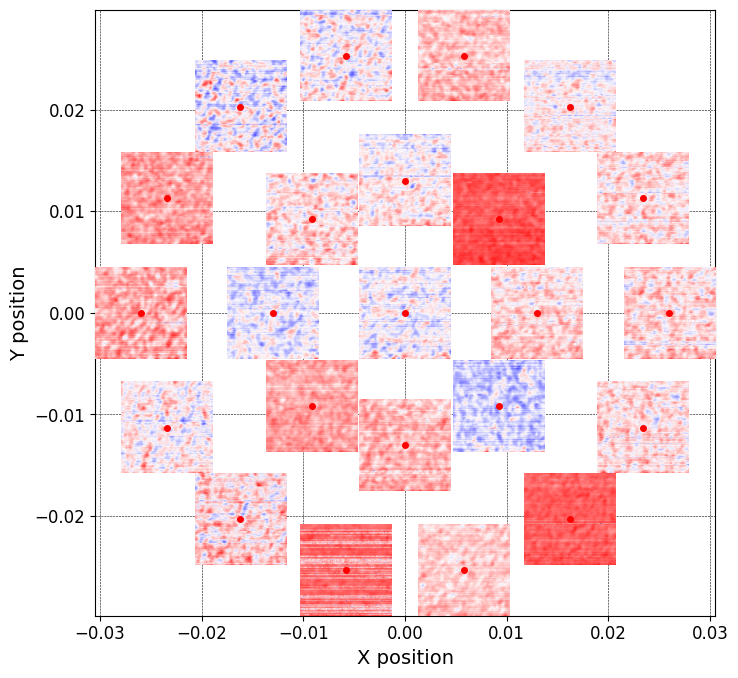

In [ ]:
channel = 4   # choose which channel to display, e.g. 0 = height, 4 = MFM
scale = 0.009   # scaling factor for image size in plot units

fig, ax = plt.subplots(figsize=(8, 8))

for img, (x, y) in zip(images, positions):
    h, w = img[channel].shape

    # extent defines where each image is placed
    extent = [x - scale/2, x + scale/2, y - scale/2, y + scale/2]

    vmin = np.min(img[channel])
    vmax = np.max(img[channel])
    vcenter = (vmin + vmax) / 2

    # Create adaptive normalization
    norm = TwoSlopeNorm(vmin=vmin, vcenter=vcenter, vmax=vmax)
    #ax.imshow(img[channel], cmap="grey", extent=extent, origin="lower", zorder=5)
    ax.imshow(img[channel], cmap=red_white_blue, norm=norm, extent=extent, origin="upper", zorder=5)

    ax.plot(x, y, "ro", markersize=4, zorder=10)  # optional: mark center with red dot

ax.set_aspect("equal")
ax.grid(True, color="black", linestyle="--", linewidth=0.4, zorder=0)


ax.set_xlabel("X position", fontsize=14)
ax.set_ylabel("Y position", fontsize=14)
ax.tick_params(axis = "both", labelsize = 12)

#plt.savefig(out_dir / "GT_MagneticResponces_as_deposit_Realmap.png",  dpi = 300, bbox_inches = "tight", pad_inches = 0)
plt.show()

# Correlation length

In [ ]:
def _radial_profile(arr):
    H, W = arr.shape
    cy, cx = H//2, W//2
    y, x = np.indices(arr.shape)
    r = np.sqrt((y-cy)**2 + (x-cx)**2)
    r_flat = r.ravel()
    a_flat = arr.ravel()
    bins = np.arange(0, r_flat.max()+1)  # 1 px bins
    prof, edges, _ = binned_statistic(r_flat, a_flat, statistic='mean', bins=bins)
    centers = 0.5*(edges[:-1] + edges[1:])
    return centers, prof

def correlation_length_nm(height_img, pixel_size_nm,
                          smooth_sigma_px=3,
                          thresholds=(0.6, 0.2, 0.1)):
                            # 0.2 for mag
                            # 0.5 for hight

    I = np.asarray(height_img, dtype=float)
    if not np.isfinite(I).any():
        return np.nan

    # detrend: remove mean (you can also high-pass if there is a slow background)
    I = I - np.nanmean(I)

    # window to reduce FFT wrap-around artifacts
    wy = np.hanning(I.shape[0])[:, None]
    wx = np.hanning(I.shape[1])[None, :]
    W = wy * wx
    Iw = I * W

    # autocorrelation via Wiener–Khinchin
    F = fft2(Iw)
    P = np.abs(F)**2
    C = fftshift(np.real(ifft2(P)))

    # normalize by zero-lag value (center), not by global max
    cy, cx = C.shape[0]//2, C.shape[1]//2
    c0 = C[cy, cx]
    if not np.isfinite(c0) or c0 == 0:
        return np.nan
    Cn = C / c0

    # radial average -> C(r); smooth to suppress noise/oscillations
    r_px, Cr = _radial_profile(Cn)
    if Cr is None or not np.isfinite(Cr).any():
        return np.nan
    Cr = gaussian_filter1d(Cr, sigma=smooth_sigma_px)

    # find first crossing for any acceptable threshold
    for thr in thresholds:
        idx = np.where(Cr <= thr)[0]
        if idx.size > 0:
            i = idx[0]
            if i == 0:
                r_star_px = r_px[i]
            else:
                # linear interpolate between (i-1) and i
                y1, y2 = Cr[i-1], Cr[i]
                x1, x2 = r_px[i-1], r_px[i]
                if y2 == y1:
                    r_star_px = x2
                else:
                    t = (thr - y1)/(y2 - y1)
                    r_star_px = x1 + t*(x2 - x1)
            return float(r_star_px * pixel_size_nm)

    # no crossing found -> correlation length exceeds FOV; return NaN or FOV
    # return np.nan
    return float(min(I.shape) * pixel_size_nm)  # or comment this and return NaN

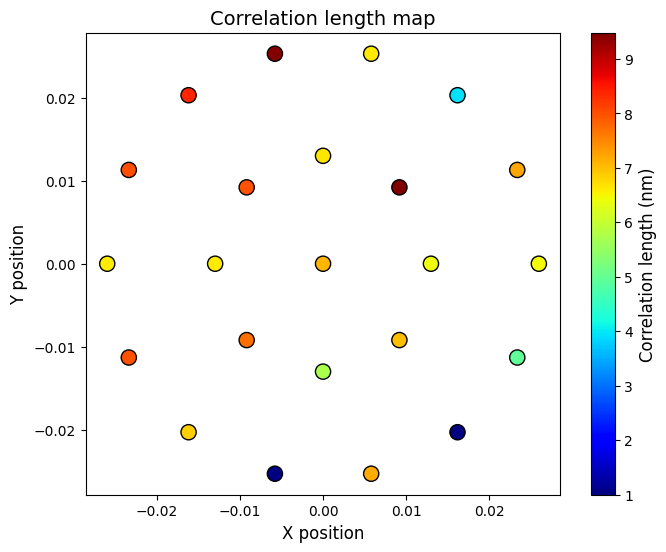

In [ ]:
# --- set parameters ---
pixel_size_nm = 2   # change to your actual calibration!
channel = 4         # 0 = height, 4 = MFM phase, etc.

correlation_lengths = []

# --- run over all images ---
for img in images:
    L = correlation_length_nm(img[channel], pixel_size_nm=pixel_size_nm)
    correlation_lengths.append(L)

correlation_lengths = np.array(correlation_lengths)

# --- plot map ---
fig, ax = plt.subplots(figsize=(8, 6))
sc = ax.scatter(
    positions[:, 0], positions[:, 1],
    c=correlation_lengths, cmap="jet",
    s=120, edgecolor="k"
)

cb = plt.colorbar(sc, ax=ax)
cb.set_label("Correlation length (nm)", fontsize=12)

ax.set_xlabel("X position", fontsize=12)
ax.set_ylabel("Y position", fontsize=12)
ax.set_title("Correlation length map", fontsize=14)
ax.set_aspect("equal")

plt.show()

In [ ]:
# Find indices of min and max correlation length
idx_max = np.nanargmax(correlation_lengths)   # ignore NaNs
idx_min = np.nanargmin(correlation_lengths)

# Values
L_max = correlation_lengths[idx_max]
L_min = correlation_lengths[idx_min]

# Corresponding positions
pos_max = positions[idx_max]
pos_min = positions[idx_min]

print(f"Max correlation length: {L_max:.2f} nm at index {idx_max}, position {pos_max}")
print(f"Min correlation length: {L_min:.2f} nm at index {idx_min}, position {pos_min}")

Max correlation length: 9.48 nm at index 2, position [0.0092 0.0092]
Min correlation length: 1.00 nm at index 19, position [-0.0058 -0.0253]


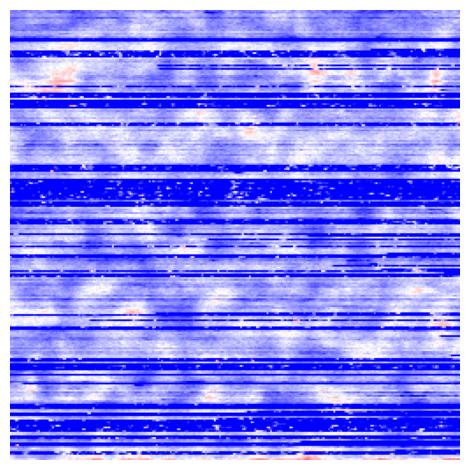

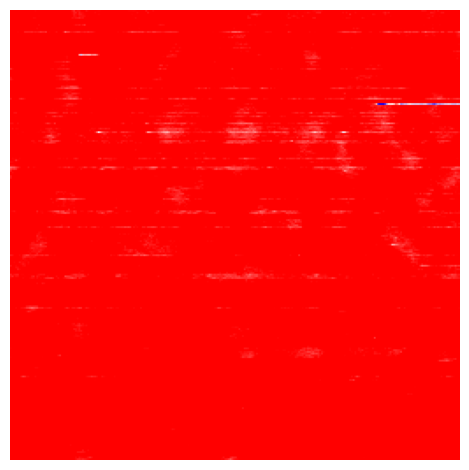

--------------------
Max corr length
9.48 nm
pos=[0.0092 0.0092], idx=2
--------------------
Min corr length
1.00 nm
pos=[-0.0058 -0.0253], idx=19


In [ ]:
# Min image
#plt.imshow(images[idx_min][channel], cmap="grey")
plt.imshow(images[idx_min][channel], cmap=red_white_blue, norm=norm)

plt.axis("off")
# plt.savefig(out_dir / "min_mag_size_0.039 0._asd.png", dpi=300, bbox_inches='tight', pad_inches=0)
plt.tight_layout()
plt.show()

# Max image
#plt.imshow(images[idx_max][channel], cmap="grey")
plt.imshow(images[idx_max][channel], cmap=red_white_blue, norm=norm)
# axes[1].set_title(f"Max corr length\n{L_max:.2f} nm\npos={pos_max}, idx={idx_max}")
plt.axis("off")
# plt.savefig(out_dir / "max_mag_size_-0.039  0._asd.png", dpi=300, bbox_inches='tight', pad_inches=0)
plt.tight_layout()
plt.show()

print("-" * 20)
print(f"Max corr length\n{L_max:.2f} nm\npos={pos_max}, idx={idx_max}")

print("-" * 20)
print(f"Min corr length\n{L_min:.2f} nm\npos={pos_min}, idx={idx_min}")

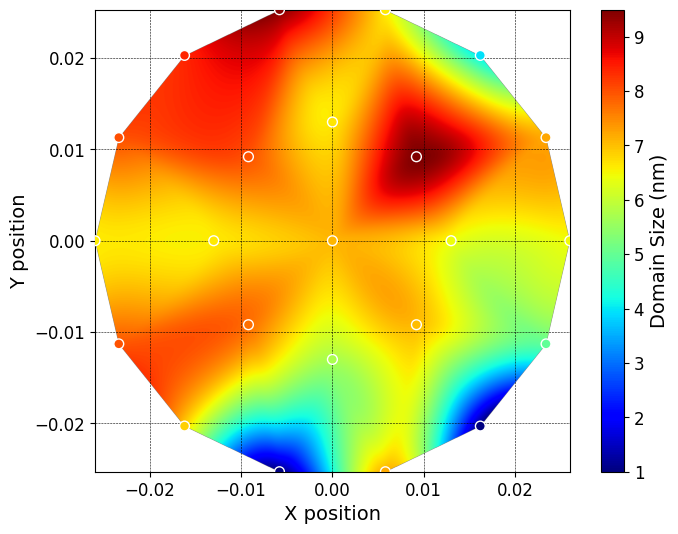

In [ ]:
# Create a regular grid covering your positions
grid_x, grid_y = np.mgrid[
    positions[:,0].min():positions[:,0].max():2000j,   # 200 points along X
    positions[:,1].min():positions[:,1].max():2000j    # 200 points along Y
]

# Interpolate values onto the grid
grid_z = griddata(positions, correlation_lengths, (grid_x, grid_y), method="cubic")

# Plot heatmap
fig, ax = plt.subplots(figsize=(8, 6))
im = ax.imshow(grid_z.T, extent=(
        positions[:,0].min(), positions[:,0].max(),
        positions[:,1].min(), positions[:,1].max()
    ),
    origin="lower", cmap="jet", aspect="equal", zorder=1)

# Overlay measurement points
sc = ax.scatter(
    positions[:,0], positions[:,1],
    c=correlation_lengths,
    cmap="jet",
    edgecolor="w",
    s=50,
    zorder=5
)

# Colorbar
cb = plt.colorbar(im, ax=ax)
cb.set_label("Domain Size (nm)", fontsize=14)
cb.ax.tick_params(labelsize = 12)

ax.set_xlabel("X position", fontsize=14)
ax.set_ylabel("Y position", fontsize=14)
ax.tick_params(axis = "both", labelsize = 12)
# ax.set_title("GT_corr MAP length map", fontsize=14)
ax.grid(True, color="black", linestyle="--", linewidth=0.4, zorder=0)

#plt.savefig(out_dir / "GT_DomainSize_as_deposit.png",  dpi = 300, bbox_inches = "tight", pad_inches = 0)
plt.show()

# my turn

In [ ]:
import numpy as np
from scipy.ndimage import median_filter

def plane_level(z):
    """Remove best-fit plane from a 2D height map."""
    y, x = np.indices(z.shape)
    G = np.c_[x.ravel(), y.ravel(), np.ones(z.size)]
    a, b, c = np.linalg.lstsq(G, z.ravel(), rcond=None)[0]
    plane = (a*x + b*y + c)
    return z - plane

def roughness_metrics_2d(z):
    """Return Sa, Sq, and Rz(ISO style: average of 5 highest peaks and 5 deepest valleys per patch)."""
    zc = z - np.mean(z)
    Sa = np.mean(np.abs(zc))
    Sq = np.sqrt(np.mean(zc**2))
    # Simple Rz estimate over the full map
    Rz = np.percentile(zc, 95) - np.percentile(zc, 5)
    return {"Sa": Sa, "Sq": Sq, "Rz_approx": Rz}

# pick a site
i = 0
z_raw = images[i, 0].astype(float)  # channel 0 = height
z_f = median_filter(z_raw, size=3)  # light denoise
z_lvl = plane_level(z_f)

metrics = roughness_metrics_2d(z_lvl)
print(metrics)  # values are in the same height units as your data (nm if your height is in nm)


{'Sa': np.float64(2.0427927019081185e-09), 'Sq': np.float64(2.7783704114551705e-09), 'Rz_approx': np.float64(8.460469168504776e-09)}


## surface roughness calculation on 23 image


### Try 1

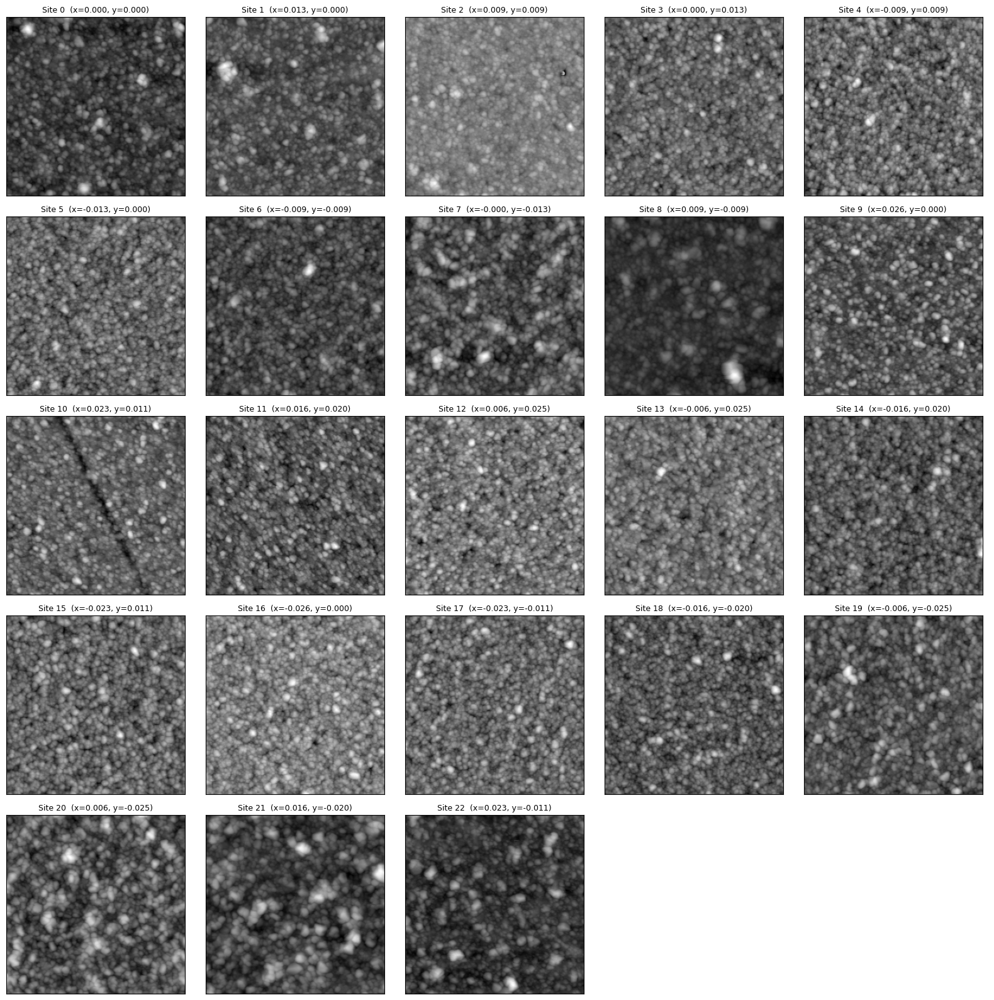

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt

# Config
CHANNEL = 0          # AFM height / topography
COLS = 5             # grid columns
SAVE_DIR = None      # e.g., "/content/afm_height_pngs" or leave as None to skip saving

def show_all_afm_height(images, positions=None, channel=CHANNEL, cols=COLS, save_dir=SAVE_DIR):
    """
    images: numpy array of shape (N, C, H, W)
    positions: optional (N, 2), used only for titles
    """
    N = images.shape[0]
    assert images.shape[1] > channel, f"Channel {channel} not found in images"

    # Create save directory if requested
    if save_dir:
        os.makedirs(save_dir, exist_ok=True)

    # Figure grid
    rows = int(np.ceil(N / cols))
    fig_w = 3.2 * cols
    fig_h = 3.2 * rows
    fig, axes = plt.subplots(rows, cols, figsize=(fig_w, fig_h))
    axes = np.atleast_2d(axes)

    for i in range(rows * cols):
        r, c = divmod(i, cols)
        ax = axes[r, c]

        if i < N:
            z = images[i, channel].astype(float)

            im = ax.imshow(z, cmap="gray", origin="lower")
            ax.set_xticks([]); ax.set_yticks([])

            # Title with site index and optional position
            if positions is not None and len(positions) > i:
                ax.set_title(f"Site {i}  (x={positions[i,0]:.3f}, y={positions[i,1]:.3f})", fontsize=9)
            else:
                ax.set_title(f"Site {i}", fontsize=9)

            # Save each panel if requested
            if save_dir:
                out_path = os.path.join(save_dir, f"afm_height_site_{i:02d}.png")
                plt.imsave(out_path, z, cmap="gray", origin="lower")
        else:
            ax.axis("off")

    # One shared colorbar
    # To keep it simple, reuse last image's mappable if available
    # If you want a precise shared scale, compute vmin/vmax over all z first
    fig.tight_layout()
    plt.show()

# Usage:
show_all_afm_height(images, positions=positions, channel=0, cols=5, save_dir=None)


In [ ]:
import numpy as np
import pandas as pd
from scipy.ndimage import median_filter

def plane_level(z):
    y, x = np.indices(z.shape)
    G = np.c_[x.ravel(), y.ravel(), np.ones(z.size)]
    a, b, c = np.linalg.lstsq(G, z.ravel(), rcond=None)[0]
    return z - (a*x + b*y + c)

def roughness_metrics_2d(z):
    zc = z - np.nanmean(z)
    Sa = np.nanmean(np.abs(zc))
    Sq = np.sqrt(np.nanmean(zc**2))
    Rz = np.nanpercentile(zc, 95) - np.nanpercentile(zc, 5)
    return {"Sa": Sa, "Sq": Sq, "Rz_approx": Rz}

def roughness_table(images, positions=None, channel=0, median_size=3):
    rows = []
    n_sites = images.shape[0]
    for i in range(n_sites):
        z_raw = images[i, channel].astype(float)
        z_f = median_filter(z_raw, size=median_size) if median_size else z_raw
        z_lvl = plane_level(z_f)
        m = roughness_metrics_2d(z_lvl)
        row = {"site": i, "channel": channel, **m}
        if positions is not None and len(positions) > i:
            row.update({"x": float(positions[i,0]), "y": float(positions[i,1])})
        rows.append(row)
    return pd.DataFrame(rows)

# Example usage:
# images shape expected: (N_sites, N_channels, H, W)
# positions optional shape: (N_sites, 2)
df_rough = roughness_table(images, positions=positions, channel=0, median_size=3)
print(df_rough.head())
# Save if you like
# df_rough.to_csv("roughness_channel0_all_sites.csv", index=False)


   site  channel            Sa            Sq     Rz_approx       x       y
0     0        0  2.042793e-09  2.778370e-09  8.460469e-09  0.0000  0.0000
1     1        0  2.090781e-09  2.857865e-09  8.797753e-09  0.0130  0.0000
2     2        0  1.428262e-09  1.921884e-09  6.048977e-09  0.0092  0.0092
3     3        0  1.400535e-09  1.811591e-09  5.783650e-09  0.0000  0.0130
4     4        0  1.651283e-09  2.119461e-09  6.936170e-09 -0.0092  0.0092


Notes

This computes Sa, Sq, and an Rz approximation for every site, using channel 0 height.

If your height units are nm, the outputs are in nm.

You can change channel=0 to target a different channel if needed.

To get line roughness (Ra, Rq), we can add a helper to compute per-scanline values and average them.

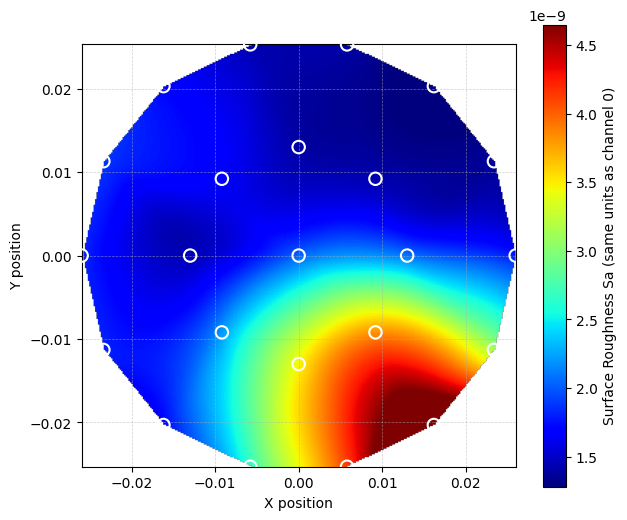

Sa per site: [2.04279270e-09 2.09078085e-09 1.42826191e-09 1.40053470e-09
 1.65128327e-09 1.45990418e-09 2.22371370e-09 3.47079923e-09
 3.81988901e-09 1.78048641e-09 1.36926472e-09 1.19181354e-09
 1.39737139e-09 1.44274593e-09 1.71273803e-09 1.88351479e-09
 1.81993906e-09 1.81174072e-09 1.71339718e-09 2.67887614e-09
 4.14309457e-09 5.34701198e-09 3.13109089e-09]


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import median_filter
from scipy.interpolate import griddata

# ------------------------------------------------------------
# 1) Roughness helpers (channel 0 = AFM height / topography)
# ------------------------------------------------------------
def plane_level(z):
    """Remove best-fit plane from a 2D height map."""
    y, x = np.indices(z.shape)
    G = np.c_[x.ravel(), y.ravel(), np.ones(z.size)]
    a, b, c = np.linalg.lstsq(G, z.ravel(), rcond=None)[0]
    return z - (a*x + b*y + c)

def roughness_Sa(z):
    """Areal average roughness Sa."""
    zc = z - np.nanmean(z)
    return float(np.nanmean(np.abs(zc)))

def compute_site_Sa(images, channel=0, median_size=3):
    """Return Sa for each site in images[:, channel, :, :]."""
    n_sites = images.shape[0]
    Sa_vals = np.zeros(n_sites, dtype=float)
    for i in range(n_sites):
        z = images[i, channel].astype(float)
        if median_size and median_size > 1:
            z = median_filter(z, size=median_size)
        z = plane_level(z)
        Sa_vals[i] = roughness_Sa(z)
    return Sa_vals

# ------------------------------------------------------------
# 2) Build an interpolated map + circular mask
#    Expect: images shape (N_sites, N_channels, H, W)
#            positions shape (N_sites, 2)
# ------------------------------------------------------------
def roughness_map(images, positions, channel=0, grid_res=300, median_size=3):
    # Per-site Sa
    Sa_vals = compute_site_Sa(images, channel=channel, median_size=median_size)

    # Grid
    x_min, x_max = positions[:,0].min(), positions[:,0].max()
    y_min, y_max = positions[:,1].min(), positions[:,1].max()
    gx, gy = np.mgrid[x_min:x_max:complex(grid_res), y_min:y_max:complex(grid_res)]

    # Interpolate (cubic → fallback to linear if needed)
    try:
        gz = griddata(positions, Sa_vals, (gx, gy), method="cubic")
    except Exception:
        gz = griddata(positions, Sa_vals, (gx, gy), method="linear")

    # Circular mask (center at mean position; radius to furthest site)
    center = positions.mean(axis=0)
    r = np.max(np.linalg.norm(positions - center, axis=1))
    rr = np.sqrt((gx - center[0])**2 + (gy - center[1])**2)
    mask = rr <= r
    gz_masked = np.where(mask, gz, np.nan)

    return gx, gy, gz_masked, Sa_vals

# ------------------------------------------------------------
# 3) Plotting
# ------------------------------------------------------------
def plot_roughness_surface(images, positions, channel=0, grid_res=300, median_size=3,
                           cmap="jet", save_path=None):
    gx, gy, gz, Sa_vals = roughness_map(images, positions, channel, grid_res, median_size)

    # Robust color limits
    finite = np.isfinite(gz)
    vmin = np.nanpercentile(gz[finite], 2) if np.any(finite) else None
    vmax = np.nanpercentile(gz[finite], 98) if np.any(finite) else None

    fig, ax = plt.subplots(figsize=(7, 6))
    im = ax.imshow(
        gz.T,
        extent=(gx.min(), gx.max(), gy.min(), gy.max()),
        origin="lower",
        aspect="equal",
        cmap=cmap,
        vmin=vmin, vmax=vmax
    )

    # Overlay measured sites as white hollow circles
    ax.scatter(positions[:,0], positions[:,1],
               facecolors="none", edgecolors="white", s=80, linewidths=1.5, zorder=5)

    # Cosmetics
    ax.set_xlabel("X position")
    ax.set_ylabel("Y position")
    cbar = plt.colorbar(im, ax=ax)
    cbar.set_label("Surface Roughness Sa (same units as channel 0)")
    ax.grid(True, linestyle="--", linewidth=0.5, alpha=0.6)

    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches="tight")
    plt.show()

    return {"Sa_per_site": Sa_vals}

# ------------------------------------------------------------
# 4) Run it (expects `images` and `positions` in memory)
# ------------------------------------------------------------
results = plot_roughness_surface(images, positions, channel=0, grid_res=300, median_size=3)
print("Sa per site:", results["Sa_per_site"])


### Try 2

Loaded 23 images with shape (23, 5, 256, 256)
Positions shape: (23, 2)

Calculating roughness for all images...
Image 0: Ra=0.000 nm, Rq=0.000 nm
Image 22: Ra=0.000 nm, Rq=0.000 nm


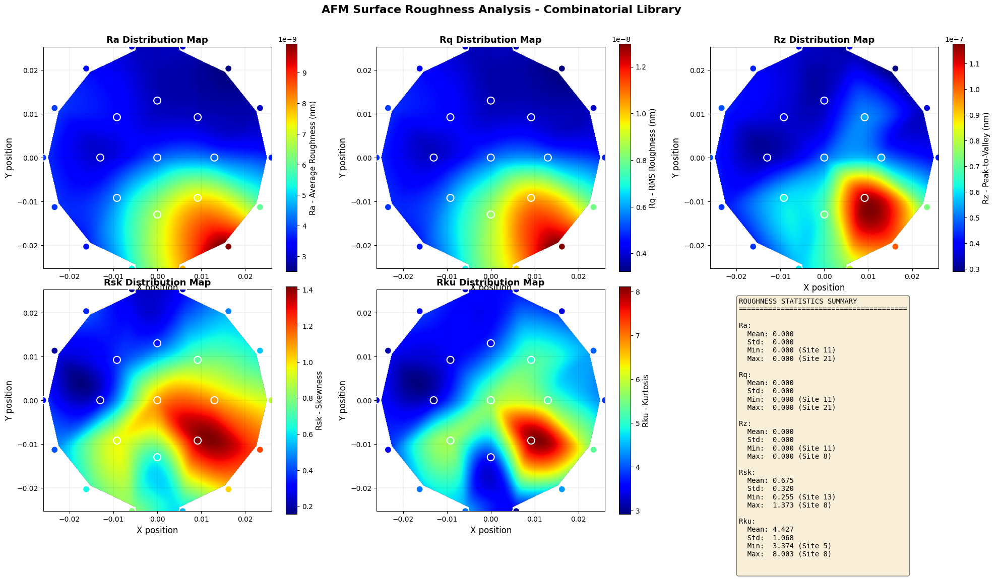

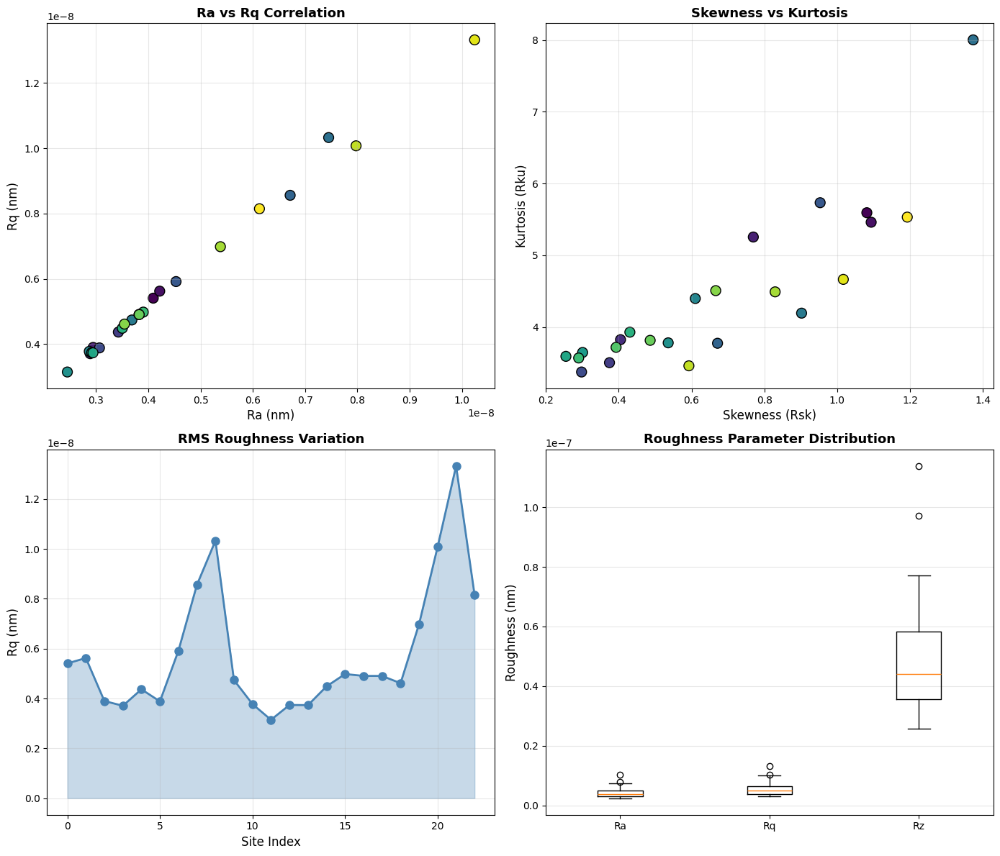


ANALYSIS COMPLETE

Total images analyzed: 23
Roughness parameters calculated: ['Ra', 'Rq', 'Rz', 'Rsk', 'Rku']

Smoothest surface (min Rq): Site 11
Roughest surface (max Rq): Site 21


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import griddata
from scipy.ndimage import gaussian_filter
import pickle
from matplotlib.colors import LinearSegmentedColormap

# Load the data
with open("auconi_mfm_grid.pkl", "rb") as f:
    data = pickle.load(f)

images = np.array(data["images"][:23])
positions = np.array(data["positions"][:23])

print(f"Loaded {len(images)} images with shape {images.shape}")
print(f"Positions shape: {positions.shape}")

# ========== ROUGHNESS CALCULATION FUNCTIONS ==========

def flatten_image(image, order=1, axis=1):
    """Remove polynomial background from image"""
    flattened_image = np.copy(image)
    num_lines = image.shape[axis]
    length = image.shape[1 - axis]
    x = np.arange(length)

    for i in range(num_lines):
        line = image[i, :] if axis == 0 else image[:, i]
        coeffs = np.polyfit(x, line, deg=order)
        fit_line = np.polyval(coeffs, x)

        if axis == 0:
            flattened_image[i, :] = line - fit_line
        else:
            flattened_image[:, i] = line - fit_line

    return flattened_image

def calculate_roughness_parameters(image, pixel_size_nm=2):
    """
    Calculate multiple surface roughness parameters:
    - Ra: Average roughness (arithmetic mean deviation)
    - Rq: RMS roughness (root mean square)
    - Rz: Ten-point height (mean peak-to-valley height)
    - Rsk: Skewness
    - Rku: Kurtosis
    """
    # Flatten the image to remove tilt/background
    flat_img = flatten_image(image, order=1, axis=0)
    flat_img = flatten_image(flat_img, order=1, axis=1)

    # Remove mean
    z = flat_img - np.mean(flat_img)

    # Calculate parameters
    Ra = np.mean(np.abs(z)) * pixel_size_nm  # Average roughness
    Rq = np.sqrt(np.mean(z**2)) * pixel_size_nm  # RMS roughness

    # Rz: average of 5 highest peaks and 5 lowest valleys
    z_sorted = np.sort(z.flatten())
    n_points = len(z_sorted)
    n_peaks = min(5, n_points // 10)
    peaks = z_sorted[-n_peaks:]
    valleys = z_sorted[:n_peaks]
    Rz = (np.mean(peaks) - np.mean(valleys)) * pixel_size_nm

    # Skewness and Kurtosis
    Rsk = np.mean(z**3) / (Rq / pixel_size_nm)**3 if Rq > 0 else 0
    Rku = np.mean(z**4) / (Rq / pixel_size_nm)**4 if Rq > 0 else 0

    return {
        'Ra': Ra,
        'Rq': Rq,
        'Rz': Rz,
        'Rsk': Rsk,
        'Rku': Rku
    }

# ========== ANALYZE ALL IMAGES ==========

channel = 0  # Height channel
pixel_size_nm = 2  # Adjust based on your calibration

roughness_data = {
    'Ra': [],
    'Rq': [],
    'Rz': [],
    'Rsk': [],
    'Rku': []
}

print("\nCalculating roughness for all images...")
for idx, img in enumerate(images):
    params = calculate_roughness_parameters(img[channel], pixel_size_nm)

    for key in roughness_data.keys():
        roughness_data[key].append(params[key])

    if idx == 0 or idx == len(images) - 1:
        print(f"Image {idx}: Ra={params['Ra']:.3f} nm, Rq={params['Rq']:.3f} nm")

# Convert to numpy arrays
for key in roughness_data.keys():
    roughness_data[key] = np.array(roughness_data[key])

# ========== VISUALIZATION ==========

# Create figure with multiple subplots
fig = plt.figure(figsize=(20, 12))

# Define parameters to plot
params_to_plot = ['Ra', 'Rq', 'Rz', 'Rsk', 'Rku']
param_labels = {
    'Ra': 'Ra - Average Roughness (nm)',
    'Rq': 'Rq - RMS Roughness (nm)',
    'Rz': 'Rz - Peak-to-Valley (nm)',
    'Rsk': 'Rsk - Skewness',
    'Rku': 'Rku - Kurtosis'
}

# Create grid for interpolation
grid_x, grid_y = np.mgrid[
    positions[:,0].min():positions[:,0].max():500j,
    positions[:,1].min():positions[:,1].max():500j
]

for idx, param in enumerate(params_to_plot):
    ax = plt.subplot(2, 3, idx + 1)

    values = roughness_data[param]

    # Interpolate values onto grid
    grid_z = griddata(positions, values, (grid_x, grid_y), method='cubic')

    # Smooth the interpolation
    grid_z = gaussian_filter(grid_z, sigma=2)

    # Plot heatmap
    im = ax.imshow(grid_z.T,
                   extent=(positions[:,0].min(), positions[:,0].max(),
                          positions[:,1].min(), positions[:,1].max()),
                   origin='lower',
                   cmap='jet',
                   aspect='equal')

    # Overlay measurement points
    sc = ax.scatter(positions[:,0], positions[:,1],
                   c=values, cmap='jet',
                   edgecolor='white', linewidth=1.5,
                   s=100, zorder=5)

    # Colorbar
    cb = plt.colorbar(im, ax=ax)
    cb.set_label(param_labels[param], fontsize=11)
    cb.ax.tick_params(labelsize=10)

    # Labels
    ax.set_xlabel('X position', fontsize=12)
    ax.set_ylabel('Y position', fontsize=12)
    ax.set_title(f'{param} Distribution Map', fontsize=13, fontweight='bold')
    ax.grid(True, color='black', linestyle='--', linewidth=0.3, alpha=0.3)
    ax.tick_params(axis='both', labelsize=10)

# Add statistics summary subplot
ax_stats = plt.subplot(2, 3, 6)
ax_stats.axis('off')

stats_text = "ROUGHNESS STATISTICS SUMMARY\n" + "="*40 + "\n\n"
for param in params_to_plot:
    values = roughness_data[param]
    stats_text += f"{param}:\n"
    stats_text += f"  Mean: {np.mean(values):.3f}\n"
    stats_text += f"  Std:  {np.std(values):.3f}\n"
    stats_text += f"  Min:  {np.min(values):.3f} (Site {np.argmin(values)})\n"
    stats_text += f"  Max:  {np.max(values):.3f} (Site {np.argmax(values)})\n\n"

ax_stats.text(0.1, 0.95, stats_text,
             transform=ax_stats.transAxes,
             fontsize=10,
             verticalalignment='top',
             fontfamily='monospace',
             bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))

plt.suptitle('AFM Surface Roughness Analysis - Combinatorial Library',
            fontsize=16, fontweight='bold', y=0.98)
plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()

# ========== ADDITIONAL ANALYSIS PLOTS ==========

# Plot 1: Correlation between different roughness parameters
fig2, axes = plt.subplots(2, 2, figsize=(14, 12))

# Ra vs Rq
axes[0,0].scatter(roughness_data['Ra'], roughness_data['Rq'],
                 c=range(len(images)), cmap='viridis', s=100, edgecolor='k')
axes[0,0].set_xlabel('Ra (nm)', fontsize=12)
axes[0,0].set_ylabel('Rq (nm)', fontsize=12)
axes[0,0].set_title('Ra vs Rq Correlation', fontsize=13, fontweight='bold')
axes[0,0].grid(True, alpha=0.3)

# Skewness vs Kurtosis
axes[0,1].scatter(roughness_data['Rsk'], roughness_data['Rku'],
                 c=range(len(images)), cmap='viridis', s=100, edgecolor='k')
axes[0,1].set_xlabel('Skewness (Rsk)', fontsize=12)
axes[0,1].set_ylabel('Kurtosis (Rku)', fontsize=12)
axes[0,1].set_title('Skewness vs Kurtosis', fontsize=13, fontweight='bold')
axes[0,1].grid(True, alpha=0.3)

# Spatial variation of Rq
axes[1,0].plot(range(len(images)), roughness_data['Rq'], 'o-',
              markersize=8, linewidth=2, color='steelblue')
axes[1,0].fill_between(range(len(images)), roughness_data['Rq'],
                       alpha=0.3, color='steelblue')
axes[1,0].set_xlabel('Site Index', fontsize=12)
axes[1,0].set_ylabel('Rq (nm)', fontsize=12)
axes[1,0].set_title('RMS Roughness Variation', fontsize=13, fontweight='bold')
axes[1,0].grid(True, alpha=0.3)

# Box plot comparison
axes[1,1].boxplot([roughness_data['Ra'], roughness_data['Rq'],
                   roughness_data['Rz']],
                  labels=['Ra', 'Rq', 'Rz'])
axes[1,1].set_ylabel('Roughness (nm)', fontsize=12)
axes[1,1].set_title('Roughness Parameter Distribution', fontsize=13, fontweight='bold')
axes[1,1].grid(True, alpha=0.3, axis='y')

plt.tight_layout()
plt.show()

# Print final summary
print("\n" + "="*60)
print("ANALYSIS COMPLETE")
print("="*60)
print(f"\nTotal images analyzed: {len(images)}")
print(f"Roughness parameters calculated: {list(roughness_data.keys())}")
print(f"\nSmoothest surface (min Rq): Site {np.argmin(roughness_data['Rq'])}")
print(f"Roughest surface (max Rq): Site {np.argmax(roughness_data['Rq'])}")

## Particle Size Distribution

Loaded 23 images with shape (23, 5, 256, 256)

Detecting particles in all images...
Image 0: 264 particles, mean size: 17.64 nm
Image 5: 379 particles, mean size: 17.77 nm
Image 10: 349 particles, mean size: 17.73 nm
Image 15: 370 particles, mean size: 18.27 nm
Image 20: 233 particles, mean size: 20.32 nm


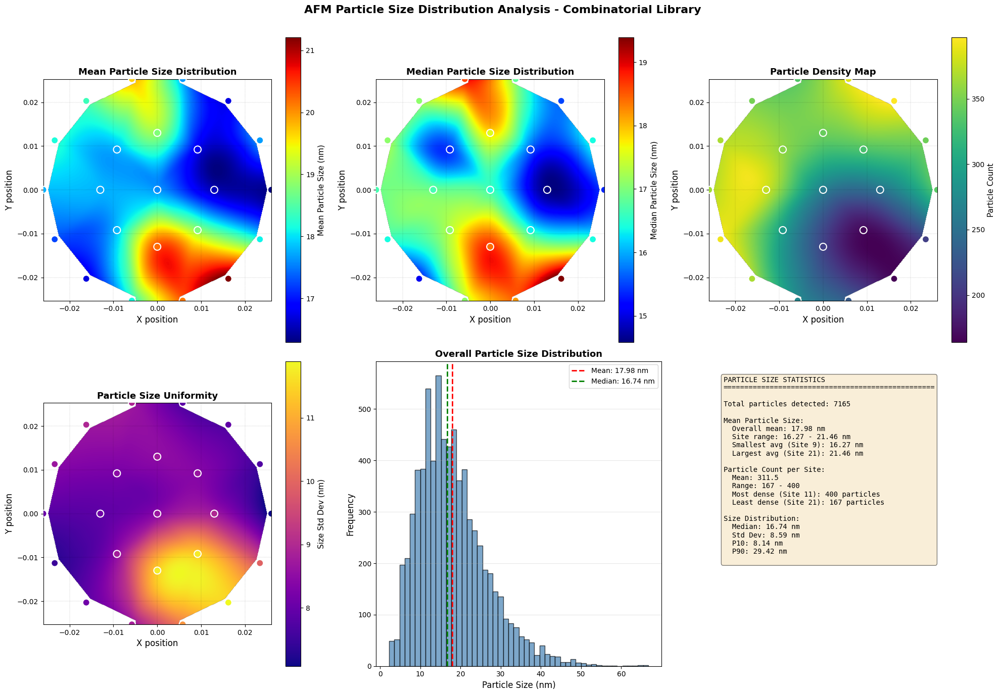

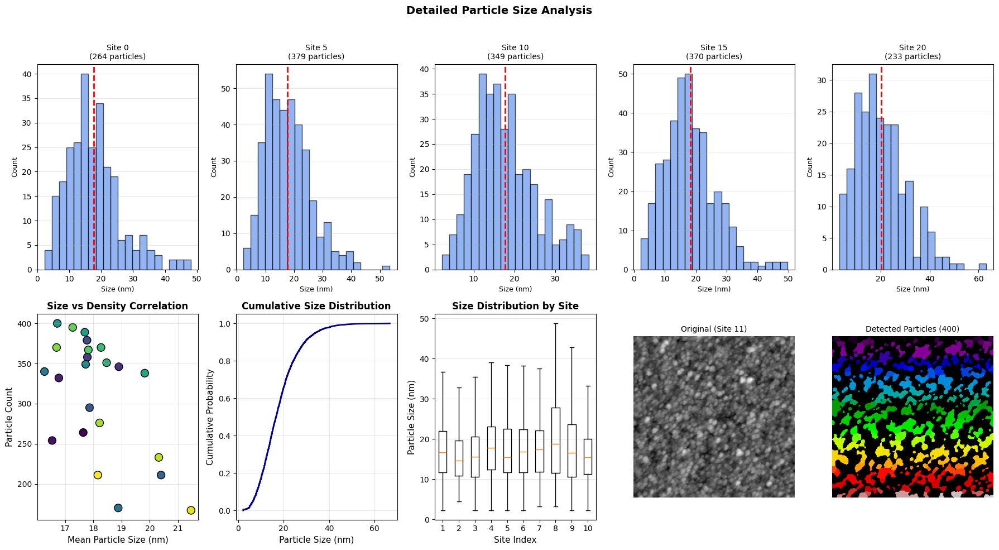


PARTICLE SIZE DISTRIBUTION ANALYSIS COMPLETE

Total particles analyzed: 7165
Overall mean size: 17.98 ± 8.59 nm
Size range: 2.26 - 66.72 nm


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import griddata
from scipy.ndimage import gaussian_filter, label, binary_dilation, binary_erosion
from skimage.filters import threshold_otsu, gaussian
from skimage.feature import peak_local_max
from skimage.measure import regionprops
from skimage.morphology import disk, remove_small_objects
from skimage.segmentation import watershed
from scipy import ndimage as ndi
import pickle
from matplotlib.colors import LinearSegmentedColormap

# Load the data
with open("auconi_mfm_grid.pkl", "rb") as f:
    data = pickle.load(f)

images = np.array(data["images"][:23])
positions = np.array(data["positions"][:23])

print(f"Loaded {len(images)} images with shape {images.shape}")

# ========== PARTICLE DETECTION AND SIZE CALCULATION ==========

def flatten_image(image, order=1, axis=1):
    """Remove polynomial background from image"""
    flattened_image = np.copy(image)
    num_lines = image.shape[axis]
    length = image.shape[1 - axis]
    x = np.arange(length)

    for i in range(num_lines):
        line = image[i, :] if axis == 0 else image[:, i]
        coeffs = np.polyfit(x, line, deg=order)
        fit_line = np.polyval(coeffs, x)

        if axis == 0:
            flattened_image[i, :] = line - fit_line
        else:
            flattened_image[:, i] = line - fit_line

    return flattened_image

def detect_particles_watershed(image, pixel_size_nm=2, min_size=5, sigma=1.5):
    """
    Detect particles using watershed segmentation
    Returns particle properties including sizes
    """
    # Flatten image to remove background
    flat_img = flatten_image(image, order=1, axis=0)
    flat_img = flatten_image(flat_img, order=1, axis=1)

    # Smooth the image
    smoothed = gaussian(flat_img, sigma=sigma)

    # Threshold using Otsu's method
    try:
        thresh = threshold_otsu(smoothed)
    except:
        # If Otsu fails, use mean + std
        thresh = np.mean(smoothed) + 0.5 * np.std(smoothed)

    # Create binary mask (particles as bright features)
    binary = smoothed > thresh

    # Clean up small noise
    binary = remove_small_objects(binary, min_size=min_size)

    # Distance transform for watershed
    distance = ndi.distance_transform_edt(binary)

    # Find local maxima as markers
    coords = peak_local_max(distance, min_distance=3, labels=binary)
    mask = np.zeros(distance.shape, dtype=bool)
    mask[tuple(coords.T)] = True
    markers = ndi.label(mask)[0]

    # Watershed segmentation
    labels = watershed(-distance, markers, mask=binary)

    # Extract particle properties
    props = regionprops(labels)

    particle_sizes = []
    particle_areas = []
    particle_perimeters = []
    particle_eccentricities = []

    for prop in props:
        # Equivalent diameter (diameter of circle with same area)
        equiv_diameter = prop.equivalent_diameter * pixel_size_nm
        area = prop.area * (pixel_size_nm ** 2)
        perimeter = prop.perimeter * pixel_size_nm

        particle_sizes.append(equiv_diameter)
        particle_areas.append(area)
        particle_perimeters.append(perimeter)
        particle_eccentricities.append(prop.eccentricity)

    return {
        'sizes': np.array(particle_sizes),
        'areas': np.array(particle_areas),
        'perimeters': np.array(particle_perimeters),
        'eccentricities': np.array(particle_eccentricities),
        'count': len(particle_sizes),
        'labels': labels
    }

# ========== ANALYZE ALL IMAGES ==========

channel = 0  # Height channel
pixel_size_nm = 2

all_particle_data = []
mean_sizes = []
median_sizes = []
particle_counts = []
std_sizes = []

print("\nDetecting particles in all images...")
for idx, img in enumerate(images):
    particle_info = detect_particles_watershed(img[channel], pixel_size_nm)
    all_particle_data.append(particle_info)

    if len(particle_info['sizes']) > 0:
        mean_sizes.append(np.mean(particle_info['sizes']))
        median_sizes.append(np.median(particle_info['sizes']))
        std_sizes.append(np.std(particle_info['sizes']))
    else:
        mean_sizes.append(0)
        median_sizes.append(0)
        std_sizes.append(0)

    particle_counts.append(particle_info['count'])

    if idx % 5 == 0:
        print(f"Image {idx}: {particle_info['count']} particles, mean size: {mean_sizes[-1]:.2f} nm")

mean_sizes = np.array(mean_sizes)
median_sizes = np.array(median_sizes)
particle_counts = np.array(particle_counts)
std_sizes = np.array(std_sizes)

# ========== MAIN VISUALIZATION ==========

fig = plt.figure(figsize=(20, 14))

# Grid for interpolation
grid_x, grid_y = np.mgrid[
    positions[:,0].min():positions[:,0].max():500j,
    positions[:,1].min():positions[:,1].max():500j
]

# 1. Mean Particle Size Map
ax1 = plt.subplot(2, 3, 1)
grid_z1 = griddata(positions, mean_sizes, (grid_x, grid_y), method='cubic')
grid_z1 = gaussian_filter(grid_z1, sigma=2)
im1 = ax1.imshow(grid_z1.T, extent=(positions[:,0].min(), positions[:,0].max(),
                 positions[:,1].min(), positions[:,1].max()),
                 origin='lower', cmap='jet', aspect='equal')
ax1.scatter(positions[:,0], positions[:,1], c=mean_sizes, cmap='jet',
           edgecolor='white', linewidth=1.5, s=100, zorder=5)
cb1 = plt.colorbar(im1, ax=ax1)
cb1.set_label('Mean Particle Size (nm)', fontsize=11)
ax1.set_xlabel('X position', fontsize=12)
ax1.set_ylabel('Y position', fontsize=12)
ax1.set_title('Mean Particle Size Distribution', fontsize=13, fontweight='bold')
ax1.grid(True, color='black', linestyle='--', linewidth=0.3, alpha=0.3)

# 2. Median Particle Size Map
ax2 = plt.subplot(2, 3, 2)
grid_z2 = griddata(positions, median_sizes, (grid_x, grid_y), method='cubic')
grid_z2 = gaussian_filter(grid_z2, sigma=2)
im2 = ax2.imshow(grid_z2.T, extent=(positions[:,0].min(), positions[:,0].max(),
                 positions[:,1].min(), positions[:,1].max()),
                 origin='lower', cmap='jet', aspect='equal')
ax2.scatter(positions[:,0], positions[:,1], c=median_sizes, cmap='jet',
           edgecolor='white', linewidth=1.5, s=100, zorder=5)
cb2 = plt.colorbar(im2, ax=ax2)
cb2.set_label('Median Particle Size (nm)', fontsize=11)
ax2.set_xlabel('X position', fontsize=12)
ax2.set_ylabel('Y position', fontsize=12)
ax2.set_title('Median Particle Size Distribution', fontsize=13, fontweight='bold')
ax2.grid(True, color='black', linestyle='--', linewidth=0.3, alpha=0.3)

# 3. Particle Count Map
ax3 = plt.subplot(2, 3, 3)
grid_z3 = griddata(positions, particle_counts, (grid_x, grid_y), method='cubic')
grid_z3 = gaussian_filter(grid_z3, sigma=2)
im3 = ax3.imshow(grid_z3.T, extent=(positions[:,0].min(), positions[:,0].max(),
                 positions[:,1].min(), positions[:,1].max()),
                 origin='lower', cmap='viridis', aspect='equal')
ax3.scatter(positions[:,0], positions[:,1], c=particle_counts, cmap='viridis',
           edgecolor='white', linewidth=1.5, s=100, zorder=5)
cb3 = plt.colorbar(im3, ax=ax3)
cb3.set_label('Particle Count', fontsize=11)
ax3.set_xlabel('X position', fontsize=12)
ax3.set_ylabel('Y position', fontsize=12)
ax3.set_title('Particle Density Map', fontsize=13, fontweight='bold')
ax3.grid(True, color='black', linestyle='--', linewidth=0.3, alpha=0.3)

# 4. Standard Deviation Map
ax4 = plt.subplot(2, 3, 4)
grid_z4 = griddata(positions, std_sizes, (grid_x, grid_y), method='cubic')
grid_z4 = gaussian_filter(grid_z4, sigma=2)
im4 = ax4.imshow(grid_z4.T, extent=(positions[:,0].min(), positions[:,0].max(),
                 positions[:,1].min(), positions[:,1].max()),
                 origin='lower', cmap='plasma', aspect='equal')
ax4.scatter(positions[:,0], positions[:,1], c=std_sizes, cmap='plasma',
           edgecolor='white', linewidth=1.5, s=100, zorder=5)
cb4 = plt.colorbar(im4, ax=ax4)
cb4.set_label('Size Std Dev (nm)', fontsize=11)
ax4.set_xlabel('X position', fontsize=12)
ax4.set_ylabel('Y position', fontsize=12)
ax4.set_title('Particle Size Uniformity', fontsize=13, fontweight='bold')
ax4.grid(True, color='black', linestyle='--', linewidth=0.3, alpha=0.3)

# 5. Combined Histogram of All Particles
ax5 = plt.subplot(2, 3, 5)
all_sizes = np.concatenate([data['sizes'] for data in all_particle_data if len(data['sizes']) > 0])
if len(all_sizes) > 0:
    ax5.hist(all_sizes, bins=50, color='steelblue', alpha=0.7, edgecolor='black')
    ax5.axvline(np.mean(all_sizes), color='red', linestyle='--', linewidth=2, label=f'Mean: {np.mean(all_sizes):.2f} nm')
    ax5.axvline(np.median(all_sizes), color='green', linestyle='--', linewidth=2, label=f'Median: {np.median(all_sizes):.2f} nm')
    ax5.set_xlabel('Particle Size (nm)', fontsize=12)
    ax5.set_ylabel('Frequency', fontsize=12)
    ax5.set_title('Overall Particle Size Distribution', fontsize=13, fontweight='bold')
    ax5.legend(fontsize=10)
    ax5.grid(True, alpha=0.3, axis='y')

# 6. Statistics Summary
ax6 = plt.subplot(2, 3, 6)
ax6.axis('off')

stats_text = "PARTICLE SIZE STATISTICS\n" + "="*50 + "\n\n"
stats_text += f"Total particles detected: {np.sum(particle_counts):.0f}\n\n"
stats_text += f"Mean Particle Size:\n"
stats_text += f"  Overall mean: {np.mean(all_sizes):.2f} nm\n"
stats_text += f"  Site range: {np.min(mean_sizes):.2f} - {np.max(mean_sizes):.2f} nm\n"
stats_text += f"  Smallest avg (Site {np.argmin(mean_sizes)}): {np.min(mean_sizes):.2f} nm\n"
stats_text += f"  Largest avg (Site {np.argmax(mean_sizes)}): {np.max(mean_sizes):.2f} nm\n\n"

stats_text += f"Particle Count per Site:\n"
stats_text += f"  Mean: {np.mean(particle_counts):.1f}\n"
stats_text += f"  Range: {np.min(particle_counts)} - {np.max(particle_counts)}\n"
stats_text += f"  Most dense (Site {np.argmax(particle_counts)}): {np.max(particle_counts)} particles\n"
stats_text += f"  Least dense (Site {np.argmin(particle_counts)}): {np.min(particle_counts)} particles\n\n"

stats_text += f"Size Distribution:\n"
stats_text += f"  Median: {np.median(all_sizes):.2f} nm\n"
stats_text += f"  Std Dev: {np.std(all_sizes):.2f} nm\n"
stats_text += f"  P10: {np.percentile(all_sizes, 10):.2f} nm\n"
stats_text += f"  P90: {np.percentile(all_sizes, 90):.2f} nm\n"

ax6.text(0.05, 0.95, stats_text, transform=ax6.transAxes,
         fontsize=10, verticalalignment='top', fontfamily='monospace',
         bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))

plt.suptitle('AFM Particle Size Distribution Analysis - Combinatorial Library',
            fontsize=16, fontweight='bold', y=0.98)
plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()

# ========== ADDITIONAL ANALYSIS PLOTS ==========

fig2 = plt.figure(figsize=(18, 10))

# 1. Individual Site Histograms (selected sites)
sites_to_show = [0, 5, 10, 15, 20]
for i, site_idx in enumerate(sites_to_show):
    ax = plt.subplot(2, 5, i+1)
    sizes = all_particle_data[site_idx]['sizes']
    if len(sizes) > 0:
        ax.hist(sizes, bins=20, color='cornflowerblue', alpha=0.7, edgecolor='black')
        ax.axvline(np.mean(sizes), color='red', linestyle='--', linewidth=2)
        ax.set_title(f'Site {site_idx}\n({len(sizes)} particles)', fontsize=10)
        ax.set_xlabel('Size (nm)', fontsize=9)
        ax.set_ylabel('Count', fontsize=9)
        ax.grid(True, alpha=0.3, axis='y')

# 2. Size vs Count correlation
ax_corr = plt.subplot(2, 5, 6)
valid_idx = mean_sizes > 0
ax_corr.scatter(mean_sizes[valid_idx], particle_counts[valid_idx],
               c=range(np.sum(valid_idx)), cmap='viridis', s=100, edgecolor='k')
ax_corr.set_xlabel('Mean Particle Size (nm)', fontsize=11)
ax_corr.set_ylabel('Particle Count', fontsize=11)
ax_corr.set_title('Size vs Density Correlation', fontsize=12, fontweight='bold')
ax_corr.grid(True, alpha=0.3)

# 3. Cumulative Distribution
ax_cdf = plt.subplot(2, 5, 7)
sorted_sizes = np.sort(all_sizes)
cdf = np.arange(1, len(sorted_sizes)+1) / len(sorted_sizes)
ax_cdf.plot(sorted_sizes, cdf, linewidth=2, color='darkblue')
ax_cdf.set_xlabel('Particle Size (nm)', fontsize=11)
ax_cdf.set_ylabel('Cumulative Probability', fontsize=11)
ax_cdf.set_title('Cumulative Size Distribution', fontsize=12, fontweight='bold')
ax_cdf.grid(True, alpha=0.3)

# 4. Box plot by site
ax_box = plt.subplot(2, 5, 8)
box_data = [all_particle_data[i]['sizes'] for i in range(min(10, len(all_particle_data)))
            if len(all_particle_data[i]['sizes']) > 0]
ax_box.boxplot(box_data, showfliers=False)
ax_box.set_xlabel('Site Index', fontsize=11)
ax_box.set_ylabel('Particle Size (nm)', fontsize=11)
ax_box.set_title('Size Distribution by Site', fontsize=12, fontweight='bold')
ax_box.grid(True, alpha=0.3, axis='y')

# 5. Example segmentation visualization
ax_seg1 = plt.subplot(2, 5, 9)
example_idx = np.argmax(particle_counts)  # Site with most particles
ax_seg1.imshow(images[example_idx][channel], cmap='gray')
ax_seg1.set_title(f'Original (Site {example_idx})', fontsize=10)
ax_seg1.axis('off')

ax_seg2 = plt.subplot(2, 5, 10)
ax_seg2.imshow(all_particle_data[example_idx]['labels'], cmap='nipy_spectral')
ax_seg2.set_title(f'Detected Particles ({particle_counts[example_idx]})', fontsize=10)
ax_seg2.axis('off')

plt.suptitle('Detailed Particle Size Analysis', fontsize=14, fontweight='bold', y=0.98)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

print("\n" + "="*70)
print("PARTICLE SIZE DISTRIBUTION ANALYSIS COMPLETE")
print("="*70)
print(f"\nTotal particles analyzed: {len(all_sizes)}")
print(f"Overall mean size: {np.mean(all_sizes):.2f} ± {np.std(all_sizes):.2f} nm")
print(f"Size range: {np.min(all_sizes):.2f} - {np.max(all_sizes):.2f} nm")

# all other feature by Clude


Loaded 23 images with shape (23, 5, 256, 256)
Channels: 0=Height, 4=MFM Phase

1. CALCULATING TEXTURE & ORIENTATION METRICS (Gabor Filters)
Image 0: Energy=0.0413, Orientation=0.0°
Image 5: Energy=0.0518, Orientation=0.0°
Image 10: Energy=0.0482, Orientation=0.0°
Image 15: Energy=0.0490, Orientation=0.0°
Image 20: Energy=0.0349, Orientation=0.0°


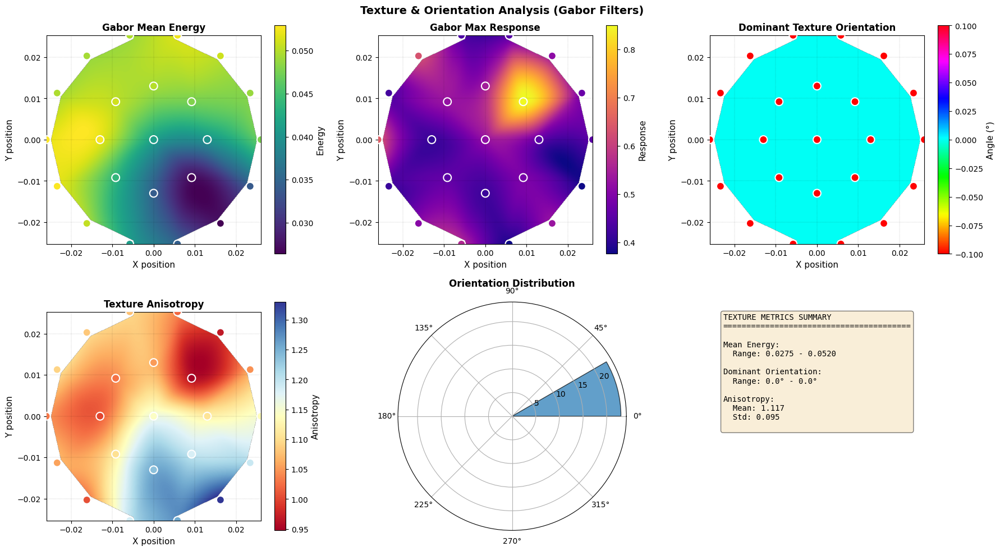


2. CALCULATING STATISTICAL DESCRIPTORS
Image 0: Mean=-0.000000, Var=0.000000, Skew=1.081
Image 5: Mean=0.000000, Var=0.000000, Skew=0.298
Image 10: Mean=-0.000000, Var=0.000000, Skew=0.610
Image 15: Mean=-0.000000, Var=0.000000, Skew=0.290
Image 20: Mean=0.000000, Var=0.000000, Skew=0.593


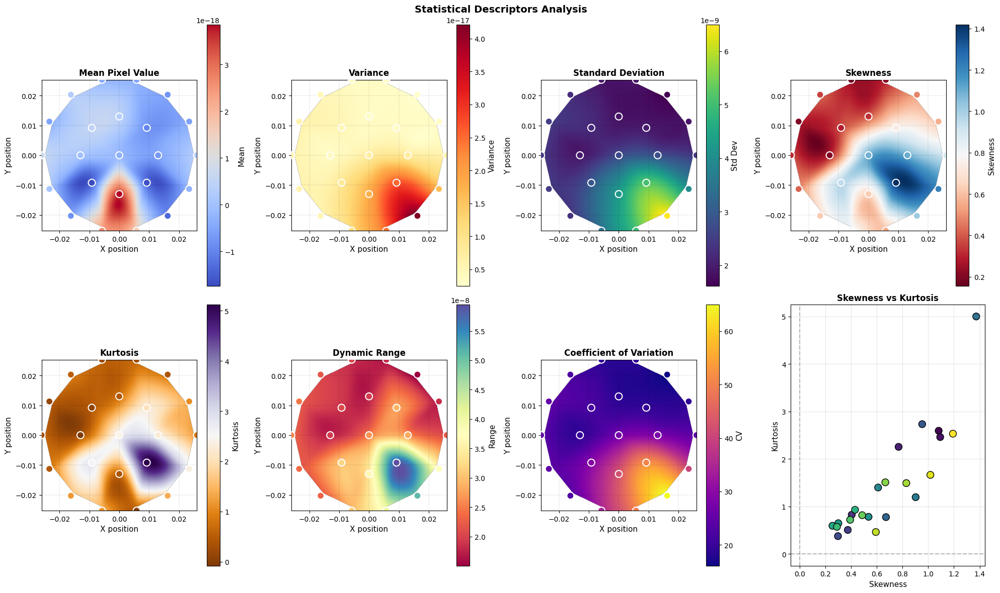


3. CALCULATING EDGE DENSITY & BOUNDARY ROUGHNESS
Image 0: Edge density=0.1302, Mean grad=0.2920
Image 5: Edge density=0.1677, Mean grad=0.3748
Image 10: Edge density=0.1489, Mean grad=0.3493
Image 15: Edge density=0.1643, Mean grad=0.3538
Image 20: Edge density=0.1379, Mean grad=0.3067


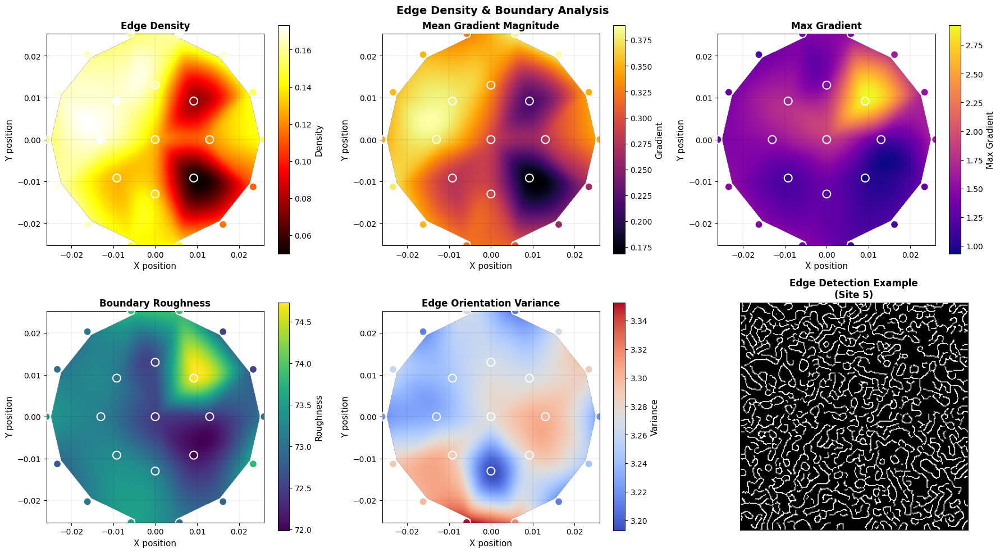


4. CALCULATING FREQUENCY-DOMAIN FEATURES (FFT)
Image 0: Total power=4.62e-09, Dominant freq=3.0
Image 5: Total power=2.38e-09, Dominant freq=2.0
Image 10: Total power=2.51e-09, Dominant freq=6.0
Image 15: Total power=4.09e-09, Dominant freq=4.0
Image 20: Total power=1.70e-08, Dominant freq=3.0


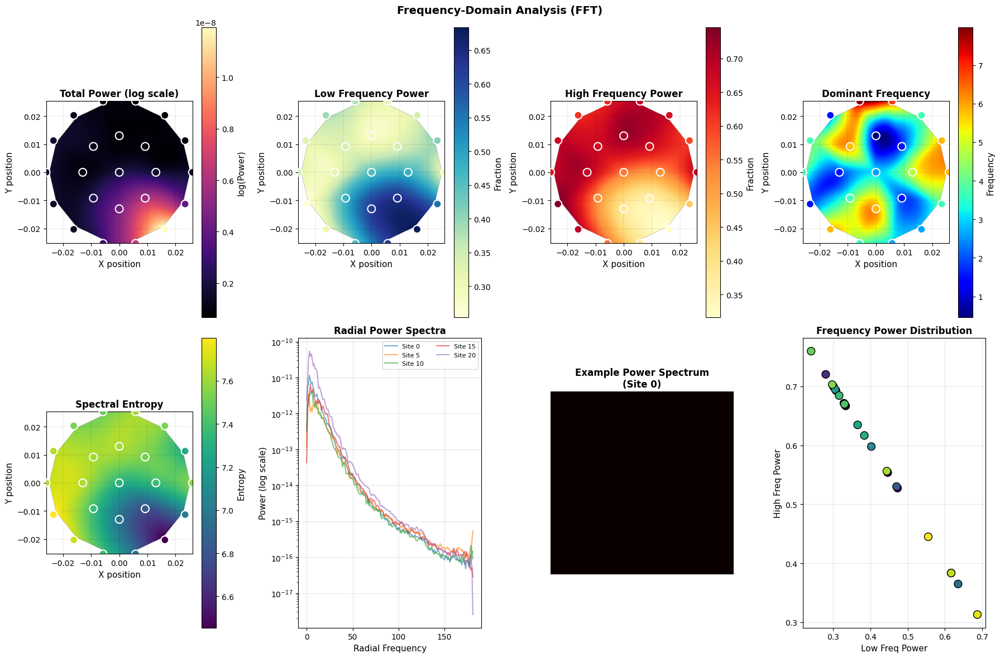


5. CALCULATING MAGNETIC DOMAIN SIZE & SHAPE (MFM Channel)
Image 0: Domains=1013, Mean size=4.92 nm
Image 5: Domains=1199, Mean size=4.72 nm
Image 10: Domains=1101, Mean size=4.53 nm
Image 15: Domains=860, Mean size=5.27 nm
Image 20: Domains=1125, Mean size=4.83 nm


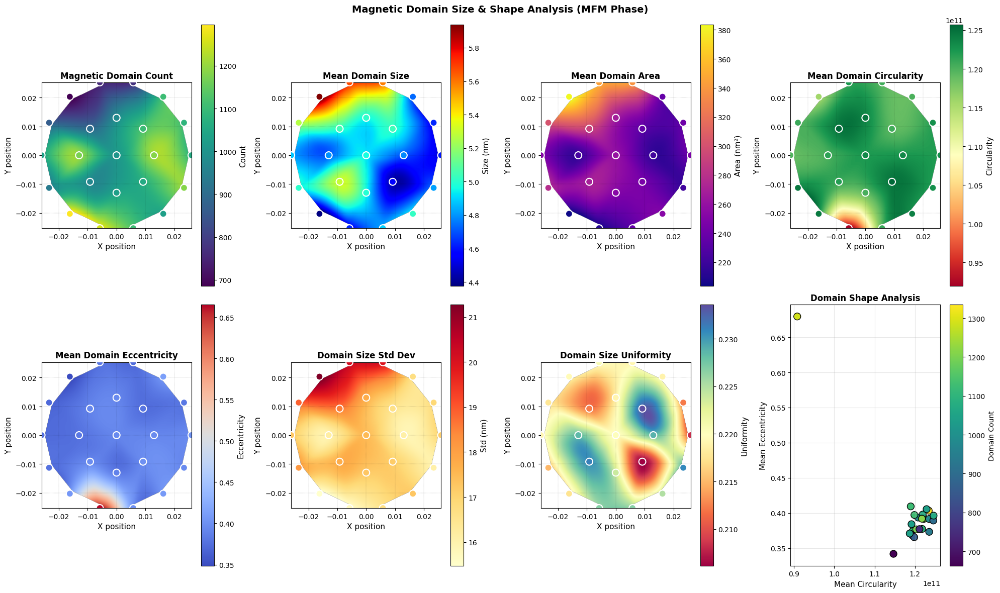


6. CALCULATING DOMAIN INTENSITY / CONTRAST (MFM Channel)
Image 0: RMS intensity=0.360150, Contrast=-15.041
Image 5: RMS intensity=0.342460, Contrast=-17.371
Image 10: RMS intensity=0.354058, Contrast=-5.819
Image 15: RMS intensity=0.420715, Contrast=-2.267
Image 20: RMS intensity=0.342838, Contrast=-2.654


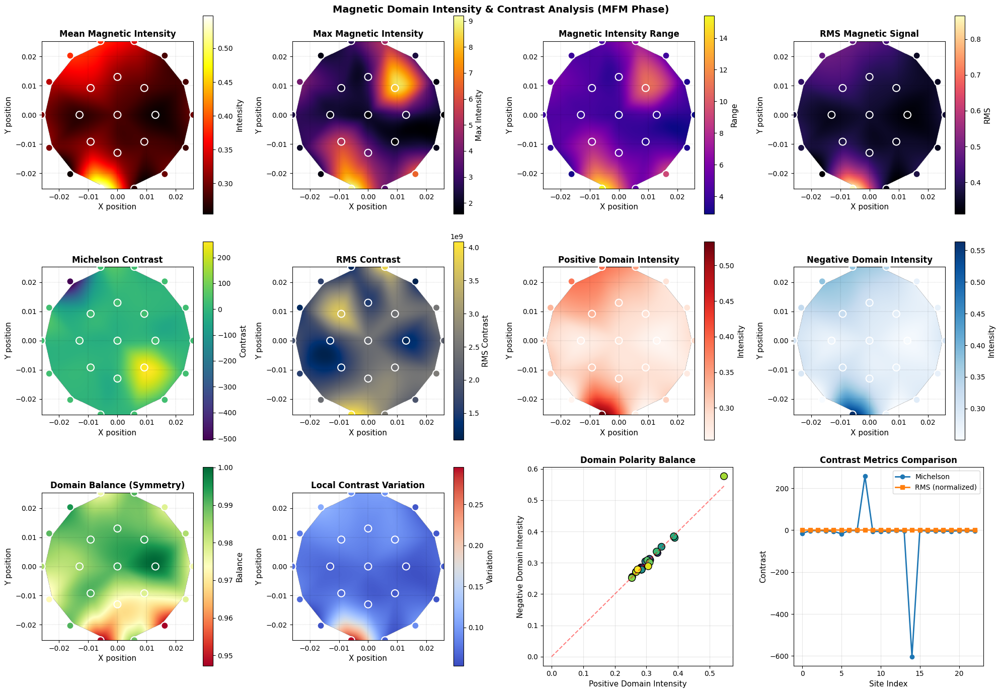


GENERATING COMPREHENSIVE SUMMARY


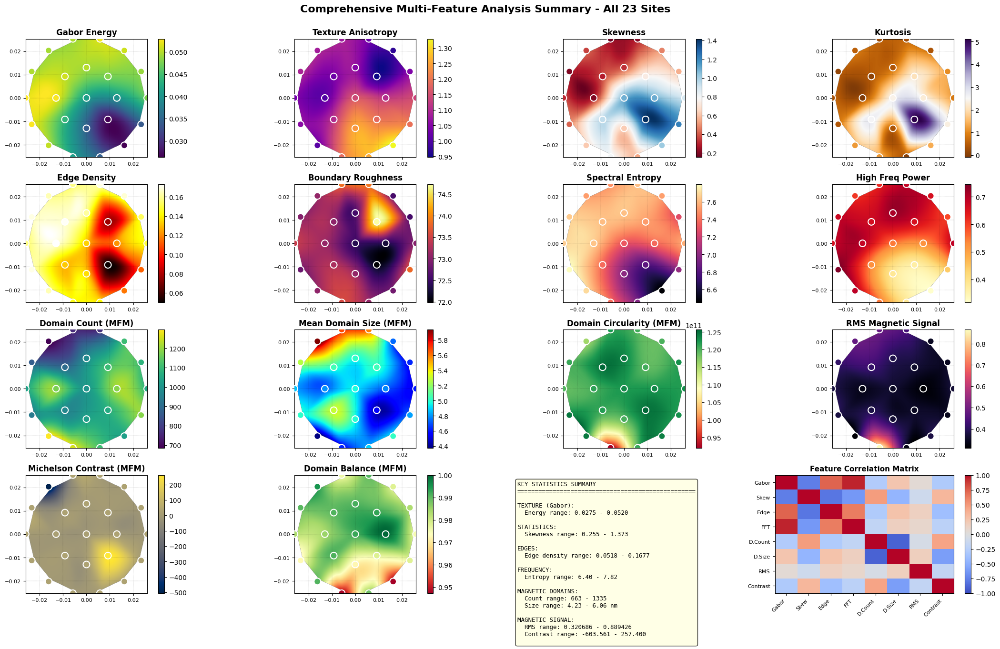


COMPLETE FEATURE EXTRACTION SUMMARY

Total images analyzed: 23

Feature categories extracted:
  1. Texture & Orientation (Gabor filters) - 4 features
  2. Statistical Descriptors - 7 features
  3. Edge Density & Boundary - 5 features
  4. Frequency-Domain (FFT) - 5 features
  5. Magnetic Domain Size & Shape - 8 features
  6. Magnetic Intensity & Contrast - 10 features

Total features extracted: 39 per image
Total feature measurements: 897

TOP SITES BY KEY METRICS

Highest Gabor Energy: Site 16 (0.0520)
Highest Edge Density: Site 5 (0.1677)
Most Magnetic Domains: Site 18 (1335 domains)
Largest Domain Size: Site 14 (6.06 nm)
Highest Magnetic Signal: Site 19 (0.889426)
Highest Contrast: Site 8 (257.400)

ANALYSIS COMPLETE - ALL FEATURES CALCULATED AND VISUALIZED


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import griddata
from scipy.ndimage import gaussian_filter, sobel, convolve
from scipy.fftpack import fft2, fftshift
from scipy.stats import skew, kurtosis
from skimage.filters import gabor_kernel, threshold_otsu
from skimage.measure import regionprops, label
from skimage.segmentation import watershed
from skimage.feature import canny
from scipy import ndimage as ndi
import pickle

# Load the data
with open("auconi_mfm_grid.pkl", "rb") as f:
    data = pickle.load(f)

images = np.array(data["images"][:23])
positions = np.array(data["positions"][:23])

print(f"Loaded {len(images)} images with shape {images.shape}")
print("Channels: 0=Height, 4=MFM Phase")

# ========== UTILITY FUNCTIONS ==========

def flatten_image(image, order=1, axis=1):
    """Remove polynomial background"""
    flattened_image = np.copy(image)
    num_lines = image.shape[axis]
    length = image.shape[1 - axis]
    x = np.arange(length)

    for i in range(num_lines):
        line = image[i, :] if axis == 0 else image[:, i]
        coeffs = np.polyfit(x, line, deg=order)
        fit_line = np.polyval(coeffs, x)

        if axis == 0:
            flattened_image[i, :] = line - fit_line
        else:
            flattened_image[:, i] = line - fit_line

    return flattened_image

def create_heatmap(ax, positions, values, title, label, cmap='jet'):
    """Create interpolated heatmap"""
    grid_x, grid_y = np.mgrid[
        positions[:,0].min():positions[:,0].max():500j,
        positions[:,1].min():positions[:,1].max():500j
    ]
    grid_z = griddata(positions, values, (grid_x, grid_y), method='cubic')
    grid_z = gaussian_filter(grid_z, sigma=2)

    im = ax.imshow(grid_z.T, extent=(positions[:,0].min(), positions[:,0].max(),
                   positions[:,1].min(), positions[:,1].max()),
                   origin='lower', cmap=cmap, aspect='equal')
    ax.scatter(positions[:,0], positions[:,1], c=values, cmap=cmap,
              edgecolor='white', linewidth=1.5, s=100, zorder=5)
    cb = plt.colorbar(im, ax=ax)
    cb.set_label(label, fontsize=11)
    ax.set_xlabel('X position', fontsize=11)
    ax.set_ylabel('Y position', fontsize=11)
    ax.set_title(title, fontsize=12, fontweight='bold')
    ax.grid(True, color='black', linestyle='--', linewidth=0.3, alpha=0.3)
    return im

# ========== 1. TEXTURE AND ORIENTATION METRICS (GABOR FILTERS) ==========

def calculate_gabor_features(image, frequencies=[0.1, 0.2, 0.3], n_orientations=4):
    """Calculate Gabor filter responses for texture analysis"""
    flat_img = flatten_image(image, order=1, axis=0)
    flat_img = flatten_image(flat_img, order=1, axis=1)

    # Normalize
    img_norm = (flat_img - np.mean(flat_img)) / (np.std(flat_img) + 1e-10)

    responses = []
    orientations = np.linspace(0, np.pi, n_orientations, endpoint=False)

    for freq in frequencies:
        for theta in orientations:
            kernel = np.real(gabor_kernel(freq, theta=theta))
            filtered = ndi.convolve(img_norm, kernel, mode='wrap')
            responses.append(filtered)

    responses = np.array(responses)

    # Calculate texture metrics
    mean_energy = np.mean(np.abs(responses))
    max_response = np.max(np.abs(responses))

    # Dominant orientation (angle with maximum response)
    mean_responses = [np.mean(np.abs(responses[i*n_orientations:(i+1)*n_orientations]), axis=0)
                     for i in range(len(frequencies))]
    orientation_strengths = [np.sum(mr) for mr in mean_responses[0:n_orientations]]
    dominant_orientation = orientations[np.argmax(orientation_strengths)] * 180 / np.pi

    # Texture anisotropy
    anisotropy = (np.max(orientation_strengths) - np.min(orientation_strengths)) / (np.mean(orientation_strengths) + 1e-10)

    return {
        'mean_energy': mean_energy,
        'max_response': max_response,
        'dominant_orientation': dominant_orientation,
        'anisotropy': anisotropy
    }

print("\n" + "="*70)
print("1. CALCULATING TEXTURE & ORIENTATION METRICS (Gabor Filters)")
print("="*70)

gabor_features = {
    'mean_energy': [],
    'max_response': [],
    'dominant_orientation': [],
    'anisotropy': []
}

for idx, img in enumerate(images):
    features = calculate_gabor_features(img[0])  # Height channel
    for key in gabor_features.keys():
        gabor_features[key].append(features[key])
    if idx % 5 == 0:
        print(f"Image {idx}: Energy={features['mean_energy']:.4f}, Orientation={features['dominant_orientation']:.1f}°")

# Convert to arrays
for key in gabor_features.keys():
    gabor_features[key] = np.array(gabor_features[key])

# Plot Gabor features
fig1 = plt.figure(figsize=(18, 10))

ax1 = plt.subplot(2, 3, 1)
create_heatmap(ax1, positions, gabor_features['mean_energy'],
               'Gabor Mean Energy', 'Energy', 'viridis')

ax2 = plt.subplot(2, 3, 2)
create_heatmap(ax2, positions, gabor_features['max_response'],
               'Gabor Max Response', 'Response', 'plasma')

ax3 = plt.subplot(2, 3, 3)
create_heatmap(ax3, positions, gabor_features['dominant_orientation'],
               'Dominant Texture Orientation', 'Angle (°)', 'hsv')

ax4 = plt.subplot(2, 3, 4)
create_heatmap(ax4, positions, gabor_features['anisotropy'],
               'Texture Anisotropy', 'Anisotropy', 'RdYlBu')

# Orientation rose plot
ax5 = plt.subplot(2, 3, 5, projection='polar')
orientations_rad = gabor_features['dominant_orientation'] * np.pi / 180
bins = np.linspace(0, 2*np.pi, 13)
hist, _ = np.histogram(orientations_rad, bins=bins)
theta = (bins[:-1] + bins[1:]) / 2
ax5.bar(theta, hist, width=2*np.pi/12, alpha=0.7, edgecolor='black')
ax5.set_title('Orientation Distribution', fontsize=12, fontweight='bold', pad=20)

# Stats summary
ax6 = plt.subplot(2, 3, 6)
ax6.axis('off')
stats_text = "TEXTURE METRICS SUMMARY\n" + "="*40 + "\n\n"
stats_text += f"Mean Energy:\n  Range: {np.min(gabor_features['mean_energy']):.4f} - {np.max(gabor_features['mean_energy']):.4f}\n\n"
stats_text += f"Dominant Orientation:\n  Range: {np.min(gabor_features['dominant_orientation']):.1f}° - {np.max(gabor_features['dominant_orientation']):.1f}°\n\n"
stats_text += f"Anisotropy:\n  Mean: {np.mean(gabor_features['anisotropy']):.3f}\n  Std: {np.std(gabor_features['anisotropy']):.3f}\n"
ax6.text(0.05, 0.95, stats_text, transform=ax6.transAxes, fontsize=10,
         verticalalignment='top', fontfamily='monospace',
         bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))

plt.suptitle('Texture & Orientation Analysis (Gabor Filters)', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

# ========== 2. STATISTICAL DESCRIPTORS ==========

def calculate_statistical_descriptors(image):
    """Calculate statistical moments of pixel values"""
    flat_img = flatten_image(image, order=1, axis=0)
    flat_img = flatten_image(flat_img, order=1, axis=1)

    pixel_values = flat_img.flatten()

    return {
        'mean': np.mean(pixel_values),
        'variance': np.var(pixel_values),
        'std': np.std(pixel_values),
        'skewness': skew(pixel_values),
        'kurtosis': kurtosis(pixel_values),
        'range': np.ptp(pixel_values),
        'cv': np.std(pixel_values) / (np.abs(np.mean(pixel_values)) + 1e-10)  # Coefficient of variation
    }

print("\n" + "="*70)
print("2. CALCULATING STATISTICAL DESCRIPTORS")
print("="*70)

stat_features = {
    'mean': [], 'variance': [], 'std': [],
    'skewness': [], 'kurtosis': [], 'range': [], 'cv': []
}

for idx, img in enumerate(images):
    features = calculate_statistical_descriptors(img[0])
    for key in stat_features.keys():
        stat_features[key].append(features[key])
    if idx % 5 == 0:
        print(f"Image {idx}: Mean={features['mean']:.6f}, Var={features['variance']:.6f}, Skew={features['skewness']:.3f}")

for key in stat_features.keys():
    stat_features[key] = np.array(stat_features[key])

# Plot statistical features
fig2 = plt.figure(figsize=(20, 12))

ax1 = plt.subplot(2, 4, 1)
create_heatmap(ax1, positions, stat_features['mean'], 'Mean Pixel Value', 'Mean', 'coolwarm')

ax2 = plt.subplot(2, 4, 2)
create_heatmap(ax2, positions, stat_features['variance'], 'Variance', 'Variance', 'YlOrRd')

ax3 = plt.subplot(2, 4, 3)
create_heatmap(ax3, positions, stat_features['std'], 'Standard Deviation', 'Std Dev', 'viridis')

ax4 = plt.subplot(2, 4, 4)
create_heatmap(ax4, positions, stat_features['skewness'], 'Skewness', 'Skewness', 'RdBu')

ax5 = plt.subplot(2, 4, 5)
create_heatmap(ax5, positions, stat_features['kurtosis'], 'Kurtosis', 'Kurtosis', 'PuOr')

ax6 = plt.subplot(2, 4, 6)
create_heatmap(ax6, positions, stat_features['range'], 'Dynamic Range', 'Range', 'Spectral')

ax7 = plt.subplot(2, 4, 7)
create_heatmap(ax7, positions, stat_features['cv'], 'Coefficient of Variation', 'CV', 'plasma')

# Distribution plots
ax8 = plt.subplot(2, 4, 8)
ax8.scatter(stat_features['skewness'], stat_features['kurtosis'],
           c=range(len(images)), cmap='viridis', s=100, edgecolor='k')
ax8.axhline(0, color='gray', linestyle='--', alpha=0.5)
ax8.axvline(0, color='gray', linestyle='--', alpha=0.5)
ax8.set_xlabel('Skewness', fontsize=11)
ax8.set_ylabel('Kurtosis', fontsize=11)
ax8.set_title('Skewness vs Kurtosis', fontsize=12, fontweight='bold')
ax8.grid(True, alpha=0.3)

plt.suptitle('Statistical Descriptors Analysis', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

# ========== 3. EDGE DENSITY & BOUNDARY ROUGHNESS ==========

def calculate_edge_features(image):
    """Calculate edge density and boundary characteristics"""
    flat_img = flatten_image(image, order=1, axis=0)
    flat_img = flatten_image(flat_img, order=1, axis=1)

    # Normalize
    img_norm = (flat_img - np.min(flat_img)) / (np.ptp(flat_img) + 1e-10)

    # Canny edge detection
    edges = canny(img_norm, sigma=2)
    edge_density = np.sum(edges) / edges.size

    # Sobel gradients
    grad_x = sobel(img_norm, axis=1)
    grad_y = sobel(img_norm, axis=0)
    gradient_magnitude = np.sqrt(grad_x**2 + grad_y**2)

    mean_gradient = np.mean(gradient_magnitude)
    max_gradient = np.max(gradient_magnitude)

    # Boundary roughness (variance of edge positions)
    if np.sum(edges) > 0:
        edge_coords = np.argwhere(edges)
        boundary_roughness = np.std(edge_coords, axis=0).mean()
    else:
        boundary_roughness = 0

    # Edge orientation variance
    grad_angle = np.arctan2(grad_y, grad_x)
    edge_orientation_var = np.var(grad_angle[edges]) if np.sum(edges) > 0 else 0

    return {
        'edge_density': edge_density,
        'mean_gradient': mean_gradient,
        'max_gradient': max_gradient,
        'boundary_roughness': boundary_roughness,
        'edge_orientation_var': edge_orientation_var
    }

print("\n" + "="*70)
print("3. CALCULATING EDGE DENSITY & BOUNDARY ROUGHNESS")
print("="*70)

edge_features = {
    'edge_density': [], 'mean_gradient': [], 'max_gradient': [],
    'boundary_roughness': [], 'edge_orientation_var': []
}

for idx, img in enumerate(images):
    features = calculate_edge_features(img[0])
    for key in edge_features.keys():
        edge_features[key].append(features[key])
    if idx % 5 == 0:
        print(f"Image {idx}: Edge density={features['edge_density']:.4f}, Mean grad={features['mean_gradient']:.4f}")

for key in edge_features.keys():
    edge_features[key] = np.array(edge_features[key])

# Plot edge features
fig3 = plt.figure(figsize=(18, 10))

ax1 = plt.subplot(2, 3, 1)
create_heatmap(ax1, positions, edge_features['edge_density'],
               'Edge Density', 'Density', 'hot')

ax2 = plt.subplot(2, 3, 2)
create_heatmap(ax2, positions, edge_features['mean_gradient'],
               'Mean Gradient Magnitude', 'Gradient', 'inferno')

ax3 = plt.subplot(2, 3, 3)
create_heatmap(ax3, positions, edge_features['max_gradient'],
               'Max Gradient', 'Max Gradient', 'plasma')

ax4 = plt.subplot(2, 3, 4)
create_heatmap(ax4, positions, edge_features['boundary_roughness'],
               'Boundary Roughness', 'Roughness', 'viridis')

ax5 = plt.subplot(2, 3, 5)
create_heatmap(ax5, positions, edge_features['edge_orientation_var'],
               'Edge Orientation Variance', 'Variance', 'coolwarm')

# Example edge detection visualization
ax6 = plt.subplot(2, 3, 6)
example_idx = np.argmax(edge_features['edge_density'])
flat_img = flatten_image(images[example_idx][0], order=1, axis=0)
flat_img = flatten_image(flat_img, order=1, axis=1)
img_norm = (flat_img - np.min(flat_img)) / (np.ptp(flat_img) + 1e-10)
edges = canny(img_norm, sigma=2)
ax6.imshow(edges, cmap='gray')
ax6.set_title(f'Edge Detection Example\n(Site {example_idx})', fontsize=12, fontweight='bold')
ax6.axis('off')

plt.suptitle('Edge Density & Boundary Analysis', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

# ========== 4. FREQUENCY-DOMAIN FEATURES (FFT) ==========

def calculate_fft_features(image):
    """Calculate FFT-based periodicity and frequency characteristics"""
    flat_img = flatten_image(image, order=1, axis=0)
    flat_img = flatten_image(flat_img, order=1, axis=1)

    # Remove mean
    img_centered = flat_img - np.mean(flat_img)

    # Apply window
    wy = np.hanning(img_centered.shape[0])[:, None]
    wx = np.hanning(img_centered.shape[1])[None, :]
    W = wy * wx
    img_windowed = img_centered * W

    # FFT
    fft = fft2(img_windowed)
    fft_shift = fftshift(fft)
    power_spectrum = np.abs(fft_shift)**2

    # Radial average
    H, W = power_spectrum.shape
    cy, cx = H//2, W//2
    y, x = np.indices(power_spectrum.shape)
    r = np.sqrt((y-cy)**2 + (x-cx)**2)

    r_flat = r.ravel()
    ps_flat = power_spectrum.ravel()

    bins = np.arange(0, r_flat.max()+1)
    radial_profile = np.zeros(len(bins)-1)

    for i in range(len(bins)-1):
        mask = (r_flat >= bins[i]) & (r_flat < bins[i+1])
        if np.sum(mask) > 0:
            radial_profile[i] = np.mean(ps_flat[mask])

    # Features
    total_power = np.sum(power_spectrum)
    low_freq_power = np.sum(power_spectrum[cy-10:cy+10, cx-10:cx+10]) / total_power
    high_freq_power = np.sum(power_spectrum) - np.sum(power_spectrum[cy-10:cy+10, cx-10:cx+10])
    high_freq_power /= total_power

    # Dominant frequency (peak in radial profile, excluding DC)
    if len(radial_profile) > 1:
        dominant_freq_idx = np.argmax(radial_profile[1:]) + 1
        dominant_freq = dominant_freq_idx
    else:
        dominant_freq = 0

    # Spectral entropy
    ps_norm = power_spectrum / (np.sum(power_spectrum) + 1e-10)
    spectral_entropy = -np.sum(ps_norm * np.log(ps_norm + 1e-10))

    return {
        'total_power': total_power,
        'low_freq_power': low_freq_power,
        'high_freq_power': high_freq_power,
        'dominant_freq': dominant_freq,
        'spectral_entropy': spectral_entropy,
        'radial_profile': radial_profile
    }

print("\n" + "="*70)
print("4. CALCULATING FREQUENCY-DOMAIN FEATURES (FFT)")
print("="*70)

fft_features = {
    'total_power': [], 'low_freq_power': [], 'high_freq_power': [],
    'dominant_freq': [], 'spectral_entropy': []
}

radial_profiles = []

for idx, img in enumerate(images):
    features = calculate_fft_features(img[0])
    for key in fft_features.keys():
        fft_features[key].append(features[key])
    radial_profiles.append(features['radial_profile'])
    if idx % 5 == 0:
        print(f"Image {idx}: Total power={features['total_power']:.2e}, Dominant freq={features['dominant_freq']:.1f}")

for key in fft_features.keys():
    fft_features[key] = np.array(fft_features[key])

# Plot FFT features
fig4 = plt.figure(figsize=(18, 12))

ax1 = plt.subplot(2, 4, 1)
create_heatmap(ax1, positions, np.log10(fft_features['total_power']+1),
               'Total Power (log scale)', 'log(Power)', 'magma')

ax2 = plt.subplot(2, 4, 2)
create_heatmap(ax2, positions, fft_features['low_freq_power'],
               'Low Frequency Power', 'Fraction', 'YlGnBu')

ax3 = plt.subplot(2, 4, 3)
create_heatmap(ax3, positions, fft_features['high_freq_power'],
               'High Frequency Power', 'Fraction', 'YlOrRd')

ax4 = plt.subplot(2, 4, 4)
create_heatmap(ax4, positions, fft_features['dominant_freq'],
               'Dominant Frequency', 'Frequency', 'jet')

ax5 = plt.subplot(2, 4, 5)
create_heatmap(ax5, positions, fft_features['spectral_entropy'],
               'Spectral Entropy', 'Entropy', 'viridis')

# Radial profile comparison
ax6 = plt.subplot(2, 4, 6)
for i in range(0, len(radial_profiles), 5):
    if len(radial_profiles[i]) > 1:
        ax6.semilogy(radial_profiles[i], alpha=0.6, label=f'Site {i}')
ax6.set_xlabel('Radial Frequency', fontsize=11)
ax6.set_ylabel('Power (log scale)', fontsize=11)
ax6.set_title('Radial Power Spectra', fontsize=12, fontweight='bold')
ax6.legend(fontsize=8, ncol=2)
ax6.grid(True, alpha=0.3)

# Example FFT visualization
ax7 = plt.subplot(2, 4, 7)
example_img = images[0][0]
flat_img = flatten_image(example_img, order=1, axis=0)
flat_img = flatten_image(flat_img, order=1, axis=1)
fft = fft2(flat_img - np.mean(flat_img))
power_spectrum = np.log10(np.abs(fftshift(fft))**2 + 1)
ax7.imshow(power_spectrum, cmap='hot')
ax7.set_title('Example Power Spectrum\n(Site 0)', fontsize=12, fontweight='bold')
ax7.axis('off')

# Power ratio plot
ax8 = plt.subplot(2, 4, 8)
ax8.scatter(fft_features['low_freq_power'], fft_features['high_freq_power'],
           c=range(len(images)), cmap='viridis', s=100, edgecolor='k')
ax8.set_xlabel('Low Freq Power', fontsize=11)
ax8.set_ylabel('High Freq Power', fontsize=11)
ax8.set_title('Frequency Power Distribution', fontsize=12, fontweight='bold')
ax8.grid(True, alpha=0.3)

plt.suptitle('Frequency-Domain Analysis (FFT)', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

# ========== 5. MAGNETIC DOMAIN SIZE & SHAPE (MFM Channel) ==========

def calculate_magnetic_domain_features(image, pixel_size_nm=2):
    """Calculate magnetic domain size and shape from MFM phase channel"""
    flat_img = flatten_image(image, order=1, axis=0)
    flat_img = flatten_image(flat_img, order=1, axis=1)

    # Threshold to create binary mask
    try:
        thresh = threshold_otsu(flat_img)
    except:
        thresh = np.mean(flat_img)

    # Create two masks: positive and negative domains
    pos_domains = flat_img > thresh
    neg_domains = flat_img < thresh

    # Label connected regions
    pos_labels = label(pos_domains)
    neg_labels = label(neg_domains)

    # Analyze regions
    pos_props = regionprops(pos_labels)
    neg_props = regionprops(neg_labels)

    all_props = pos_props + neg_props

    if len(all_props) == 0:
        return {
            'domain_count': 0,
            'mean_domain_size': 0,
            'median_domain_size': 0,
            'mean_domain_area': 0,
            'mean_circularity': 0,
            'mean_eccentricity': 0,
            'domain_size_std': 0,
            'size_uniformity': 0
        }

    # Extract properties
    sizes = [prop.equivalent_diameter * pixel_size_nm for prop in all_props]
    areas = [prop.area * pixel_size_nm**2 for prop in all_props]
    perimeters = [prop.perimeter * pixel_size_nm for prop in all_props]

    # Circularity = 4π*Area / Perimeter²
    circularities = [4*np.pi*prop.area / (prop.perimeter**2 + 1e-10) for prop in all_props]
    eccentricities = [prop.eccentricity for prop in all_props]

    return {
        'domain_count': len(all_props),
        'mean_domain_size': np.mean(sizes),
        'median_domain_size': np.median(sizes),
        'mean_domain_area': np.mean(areas),
        'mean_circularity': np.mean(circularities),
        'mean_eccentricity': np.mean(eccentricities),
        'domain_size_std': np.std(sizes),
        'size_uniformity': 1.0 / (1.0 + np.std(sizes)/np.mean(sizes)) if np.mean(sizes) > 0 else 0
    }

print("\n" + "="*70)
print("5. CALCULATING MAGNETIC DOMAIN SIZE & SHAPE (MFM Channel)")
print("="*70)

domain_features = {
    'domain_count': [], 'mean_domain_size': [], 'median_domain_size': [],
    'mean_domain_area': [], 'mean_circularity': [], 'mean_eccentricity': [],
    'domain_size_std': [], 'size_uniformity': []
}

for idx, img in enumerate(images):
    features = calculate_magnetic_domain_features(img[4])  # MFM channel
    for key in domain_features.keys():
        domain_features[key].append(features[key])
    if idx % 5 == 0:
        print(f"Image {idx}: Domains={features['domain_count']}, Mean size={features['mean_domain_size']:.2f} nm")

for key in domain_features.keys():
    domain_features[key] = np.array(domain_features[key])

# Plot magnetic domain features
fig5 = plt.figure(figsize=(20, 12))

ax1 = plt.subplot(2, 4, 1)
create_heatmap(ax1, positions, domain_features['domain_count'],
               'Magnetic Domain Count', 'Count', 'viridis')

ax2 = plt.subplot(2, 4, 2)
create_heatmap(ax2, positions, domain_features['mean_domain_size'],
               'Mean Domain Size', 'Size (nm)', 'jet')

ax3 = plt.subplot(2, 4, 3)
create_heatmap(ax3, positions, domain_features['mean_domain_area'],
               'Mean Domain Area', 'Area (nm²)', 'plasma')

ax4 = plt.subplot(2, 4, 4)
create_heatmap(ax4, positions, domain_features['mean_circularity'],
               'Mean Domain Circularity', 'Circularity', 'RdYlGn')

ax5 = plt.subplot(2, 4, 5)
create_heatmap(ax5, positions, domain_features['mean_eccentricity'],
               'Mean Domain Eccentricity', 'Eccentricity', 'coolwarm')

ax6 = plt.subplot(2, 4, 6)
create_heatmap(ax6, positions, domain_features['domain_size_std'],
               'Domain Size Std Dev', 'Std (nm)', 'YlOrRd')

ax7 = plt.subplot(2, 4, 7)
create_heatmap(ax7, positions, domain_features['size_uniformity'],
               'Domain Size Uniformity', 'Uniformity', 'Spectral')

# Scatter plot
ax8 = plt.subplot(2, 4, 8)
ax8.scatter(domain_features['mean_circularity'], domain_features['mean_eccentricity'],
           c=domain_features['domain_count'], cmap='viridis', s=100, edgecolor='k')
cbar = plt.colorbar(ax8.collections[0], ax=ax8)
cbar.set_label('Domain Count', fontsize=10)
ax8.set_xlabel('Mean Circularity', fontsize=11)
ax8.set_ylabel('Mean Eccentricity', fontsize=11)
ax8.set_title('Domain Shape Analysis', fontsize=12, fontweight='bold')
ax8.grid(True, alpha=0.3)

plt.suptitle('Magnetic Domain Size & Shape Analysis (MFM Phase)', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

# ========== 6. DOMAIN INTENSITY / CONTRAST (MFM Channel) ==========

def calculate_magnetic_intensity_features(image):
    """Calculate magnetic signal strength and contrast from MFM phase"""
    flat_img = flatten_image(image, order=1, axis=0)
    flat_img = flatten_image(flat_img, order=1, axis=1)

    # Intensity statistics
    mean_intensity = np.mean(np.abs(flat_img))
    max_intensity = np.max(np.abs(flat_img))
    intensity_range = np.ptp(flat_img)

    # RMS (magnetic signal strength)
    rms_intensity = np.sqrt(np.mean(flat_img**2))

    # Contrast metrics
    # Michelson contrast
    I_max = np.max(flat_img)
    I_min = np.min(flat_img)
    michelson_contrast = (I_max - I_min) / (I_max + I_min + 1e-10)

    # RMS contrast
    rms_contrast = np.std(flat_img) / (np.abs(np.mean(flat_img)) + 1e-10)

    # Separate positive and negative domains
    pos_intensity = np.mean(flat_img[flat_img > 0]) if np.any(flat_img > 0) else 0
    neg_intensity = np.mean(np.abs(flat_img[flat_img < 0])) if np.any(flat_img < 0) else 0

    # Domain balance (how symmetric are positive/negative domains)
    domain_balance = min(pos_intensity, neg_intensity) / (max(pos_intensity, neg_intensity) + 1e-10)

    # Local contrast variation
    local_std = np.std([np.std(flat_img[i:i+16, j:j+16])
                       for i in range(0, flat_img.shape[0]-16, 16)
                       for j in range(0, flat_img.shape[1]-16, 16)])

    return {
        'mean_intensity': mean_intensity,
        'max_intensity': max_intensity,
        'intensity_range': intensity_range,
        'rms_intensity': rms_intensity,
        'michelson_contrast': michelson_contrast,
        'rms_contrast': rms_contrast,
        'pos_intensity': pos_intensity,
        'neg_intensity': neg_intensity,
        'domain_balance': domain_balance,
        'local_contrast_var': local_std
    }

print("\n" + "="*70)
print("6. CALCULATING DOMAIN INTENSITY / CONTRAST (MFM Channel)")
print("="*70)

intensity_features = {
    'mean_intensity': [], 'max_intensity': [], 'intensity_range': [],
    'rms_intensity': [], 'michelson_contrast': [], 'rms_contrast': [],
    'pos_intensity': [], 'neg_intensity': [], 'domain_balance': [],
    'local_contrast_var': []
}

for idx, img in enumerate(images):
    features = calculate_magnetic_intensity_features(img[4])  # MFM channel
    for key in intensity_features.keys():
        intensity_features[key].append(features[key])
    if idx % 5 == 0:
        print(f"Image {idx}: RMS intensity={features['rms_intensity']:.6f}, Contrast={features['michelson_contrast']:.3f}")

for key in intensity_features.keys():
    intensity_features[key] = np.array(intensity_features[key])

# Plot magnetic intensity features
fig6 = plt.figure(figsize=(20, 14))

ax1 = plt.subplot(3, 4, 1)
create_heatmap(ax1, positions, intensity_features['mean_intensity'],
               'Mean Magnetic Intensity', 'Intensity', 'hot')

ax2 = plt.subplot(3, 4, 2)
create_heatmap(ax2, positions, intensity_features['max_intensity'],
               'Max Magnetic Intensity', 'Max Intensity', 'inferno')

ax3 = plt.subplot(3, 4, 3)
create_heatmap(ax3, positions, intensity_features['intensity_range'],
               'Magnetic Intensity Range', 'Range', 'plasma')

ax4 = plt.subplot(3, 4, 4)
create_heatmap(ax4, positions, intensity_features['rms_intensity'],
               'RMS Magnetic Signal', 'RMS', 'magma')

ax5 = plt.subplot(3, 4, 5)
create_heatmap(ax5, positions, intensity_features['michelson_contrast'],
               'Michelson Contrast', 'Contrast', 'viridis')

ax6 = plt.subplot(3, 4, 6)
create_heatmap(ax6, positions, intensity_features['rms_contrast'],
               'RMS Contrast', 'RMS Contrast', 'cividis')

ax7 = plt.subplot(3, 4, 7)
create_heatmap(ax7, positions, intensity_features['pos_intensity'],
               'Positive Domain Intensity', 'Intensity', 'Reds')

ax8 = plt.subplot(3, 4, 8)
create_heatmap(ax8, positions, intensity_features['neg_intensity'],
               'Negative Domain Intensity', 'Intensity', 'Blues')

ax9 = plt.subplot(3, 4, 9)
create_heatmap(ax9, positions, intensity_features['domain_balance'],
               'Domain Balance (Symmetry)', 'Balance', 'RdYlGn')

ax10 = plt.subplot(3, 4, 10)
create_heatmap(ax10, positions, intensity_features['local_contrast_var'],
               'Local Contrast Variation', 'Variation', 'coolwarm')

# Comparison plots
ax11 = plt.subplot(3, 4, 11)
ax11.scatter(intensity_features['pos_intensity'], intensity_features['neg_intensity'],
            c=range(len(images)), cmap='viridis', s=100, edgecolor='k')
ax11.plot([0, max(intensity_features['pos_intensity'])],
         [0, max(intensity_features['pos_intensity'])], 'r--', alpha=0.5)
ax11.set_xlabel('Positive Domain Intensity', fontsize=11)
ax11.set_ylabel('Negative Domain Intensity', fontsize=11)
ax11.set_title('Domain Polarity Balance', fontsize=12, fontweight='bold')
ax11.grid(True, alpha=0.3)

# Contrast comparison
ax12 = plt.subplot(3, 4, 12)
sites = np.arange(len(images))
ax12.plot(sites, intensity_features['michelson_contrast'], 'o-',
         label='Michelson', markersize=6, linewidth=2)
ax12.plot(sites, intensity_features['rms_contrast'] / np.max(intensity_features['rms_contrast']),
         's-', label='RMS (normalized)', markersize=6, linewidth=2)
ax12.set_xlabel('Site Index', fontsize=11)
ax12.set_ylabel('Contrast', fontsize=11)
ax12.set_title('Contrast Metrics Comparison', fontsize=12, fontweight='bold')
ax12.legend(fontsize=10)
ax12.grid(True, alpha=0.3)

plt.suptitle('Magnetic Domain Intensity & Contrast Analysis (MFM Phase)', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

# ========== COMPREHENSIVE SUMMARY FIGURE ==========

print("\n" + "="*70)
print("GENERATING COMPREHENSIVE SUMMARY")
print("="*70)

fig7 = plt.figure(figsize=(22, 14))

# Select key features for overview
key_features = [
    ('Gabor Energy', gabor_features['mean_energy'], 'viridis'),
    ('Texture Anisotropy', gabor_features['anisotropy'], 'plasma'),
    ('Skewness', stat_features['skewness'], 'RdBu'),
    ('Kurtosis', stat_features['kurtosis'], 'PuOr'),
    ('Edge Density', edge_features['edge_density'], 'hot'),
    ('Boundary Roughness', edge_features['boundary_roughness'], 'inferno'),
    ('Spectral Entropy', fft_features['spectral_entropy'], 'magma'),
    ('High Freq Power', fft_features['high_freq_power'], 'YlOrRd'),
    ('Domain Count (MFM)', domain_features['domain_count'], 'viridis'),
    ('Mean Domain Size (MFM)', domain_features['mean_domain_size'], 'jet'),
    ('Domain Circularity (MFM)', domain_features['mean_circularity'], 'RdYlGn'),
    ('RMS Magnetic Signal', intensity_features['rms_intensity'], 'magma'),
    ('Michelson Contrast (MFM)', intensity_features['michelson_contrast'], 'cividis'),
    ('Domain Balance (MFM)', intensity_features['domain_balance'], 'RdYlGn'),
]

for idx, (title, values, cmap) in enumerate(key_features):
    ax = plt.subplot(4, 4, idx+1)
    create_heatmap(ax, positions, values, title, '', cmap)
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.tick_params(labelsize=8)

# Statistics table
ax_table = plt.subplot(4, 4, 15)
ax_table.axis('off')
ax_table.axis('tight')

table_text = "KEY STATISTICS SUMMARY\n" + "="*50 + "\n\n"
table_text += "TEXTURE (Gabor):\n"
table_text += f"  Energy range: {np.min(gabor_features['mean_energy']):.4f} - {np.max(gabor_features['mean_energy']):.4f}\n\n"
table_text += "STATISTICS:\n"
table_text += f"  Skewness range: {np.min(stat_features['skewness']):.3f} - {np.max(stat_features['skewness']):.3f}\n\n"
table_text += "EDGES:\n"
table_text += f"  Edge density range: {np.min(edge_features['edge_density']):.4f} - {np.max(edge_features['edge_density']):.4f}\n\n"
table_text += "FREQUENCY:\n"
table_text += f"  Entropy range: {np.min(fft_features['spectral_entropy']):.2f} - {np.max(fft_features['spectral_entropy']):.2f}\n\n"
table_text += "MAGNETIC DOMAINS:\n"
table_text += f"  Count range: {int(np.min(domain_features['domain_count']))} - {int(np.max(domain_features['domain_count']))}\n"
table_text += f"  Size range: {np.min(domain_features['mean_domain_size']):.2f} - {np.max(domain_features['mean_domain_size']):.2f} nm\n\n"
table_text += "MAGNETIC SIGNAL:\n"
table_text += f"  RMS range: {np.min(intensity_features['rms_intensity']):.6f} - {np.max(intensity_features['rms_intensity']):.6f}\n"
table_text += f"  Contrast range: {np.min(intensity_features['michelson_contrast']):.3f} - {np.max(intensity_features['michelson_contrast']):.3f}\n"

ax_table.text(0.05, 0.95, table_text, transform=ax_table.transAxes,
             fontsize=9, verticalalignment='top', fontfamily='monospace',
             bbox=dict(boxstyle='round', facecolor='lightyellow', alpha=0.8))

# Correlation heatmap
ax_corr = plt.subplot(4, 4, 16)

# Select key features for correlation
corr_features = np.column_stack([
    gabor_features['mean_energy'],
    stat_features['skewness'],
    edge_features['edge_density'],
    fft_features['spectral_entropy'],
    domain_features['domain_count'],
    domain_features['mean_domain_size'],
    intensity_features['rms_intensity'],
    intensity_features['michelson_contrast']
])

corr_matrix = np.corrcoef(corr_features.T)
im = ax_corr.imshow(corr_matrix, cmap='coolwarm', vmin=-1, vmax=1, aspect='auto')
ax_corr.set_xticks(range(8))
ax_corr.set_yticks(range(8))
labels = ['Gabor', 'Skew', 'Edge', 'FFT', 'D.Count', 'D.Size', 'RMS', 'Contrast']
ax_corr.set_xticklabels(labels, rotation=45, ha='right', fontsize=8)
ax_corr.set_yticklabels(labels, fontsize=8)
ax_corr.set_title('Feature Correlation Matrix', fontsize=11, fontweight='bold')
plt.colorbar(im, ax=ax_corr)

plt.suptitle('Comprehensive Multi-Feature Analysis Summary - All 23 Sites',
            fontsize=16, fontweight='bold')
plt.tight_layout(rect=[0, 0, 1, 0.98])
plt.show()

# ========== FINAL SUMMARY STATISTICS ==========

print("\n" + "="*70)
print("COMPLETE FEATURE EXTRACTION SUMMARY")
print("="*70)
print(f"\nTotal images analyzed: {len(images)}")
print(f"\nFeature categories extracted:")
print("  1. Texture & Orientation (Gabor filters) - 4 features")
print("  2. Statistical Descriptors - 7 features")
print("  3. Edge Density & Boundary - 5 features")
print("  4. Frequency-Domain (FFT) - 5 features")
print("  5. Magnetic Domain Size & Shape - 8 features")
print("  6. Magnetic Intensity & Contrast - 10 features")
print(f"\nTotal features extracted: 39 per image")
print(f"Total feature measurements: {39 * len(images)}")

print("\n" + "="*70)
print("TOP SITES BY KEY METRICS")
print("="*70)

print(f"\nHighest Gabor Energy: Site {np.argmax(gabor_features['mean_energy'])} ({np.max(gabor_features['mean_energy']):.4f})")
print(f"Highest Edge Density: Site {np.argmax(edge_features['edge_density'])} ({np.max(edge_features['edge_density']):.4f})")
print(f"Most Magnetic Domains: Site {np.argmax(domain_features['domain_count'])} ({int(np.max(domain_features['domain_count']))} domains)")
print(f"Largest Domain Size: Site {np.argmax(domain_features['mean_domain_size'])} ({np.max(domain_features['mean_domain_size']):.2f} nm)")
print(f"Highest Magnetic Signal: Site {np.argmax(intensity_features['rms_intensity'])} ({np.max(intensity_features['rms_intensity']):.6f})")
print(f"Highest Contrast: Site {np.argmax(intensity_features['michelson_contrast'])} ({np.max(intensity_features['michelson_contrast']):.3f})")

print("\n" + "="*70)
print("ANALYSIS COMPLETE - ALL FEATURES CALCULATED AND VISUALIZED")
print("="*70)